Paper link: http://snap.stanford.edu/class/cs224w-2017/projects/cs224w-11-final.pdf

In [1]:
# Settings for autoreloading

%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import networkx as nx

In [3]:
from random import seed

SEED = 42

np.random.seed(SEED)
seed(SEED)

In [4]:
import os
CITY_NAME = 'Bristol'
GEOJSON_PATH = os.path.join('data', 'bristol_msoa.json')
TRAVEL_TIMES_DATA_PATH = os.path.join('data', 'bristol-msoa-2020-1-OnlyWeekdays-HourlyAggregate.csv')

In [5]:
import os
from utils.geodataframe import get_geodataframe

gdf = get_geodataframe(GEOJSON_PATH)

print(f'Geodataframe of {CITY_NAME}:')
gdf.head()

Geodataframe of Bristol:


,geometry,msoa11cd,MOVEMENT_ID,DISPLAY_NAME
0,"POLYGON ((-2.60799 51.47167, -2.60782 51.47159...",E02003033,1,Bristol 022
1,"POLYGON ((-2.57022 51.47044, -2.56881 51.46956...",E02003034,2,Bristol 023
2,"POLYGON ((-2.59321 51.46918, -2.59304 51.46895...",E02003036,3,Bristol 025
3,"POLYGON ((-2.60869 51.46203, -2.60858 51.46177...",E02003037,4,Bristol 026
4,"POLYGON ((-2.51285 51.46668, -2.51286 51.46650...",E02003038,5,Bristol 027


In [6]:
from utils.geodataframe import set_geodataframe_centroids

set_geodataframe_centroids(gdf)

In [7]:
print(f'Geodataframe of {CITY_NAME} after the centroid computation:')
gdf.head()

Geodataframe of Bristol after the centroid computation:


,geometry,msoa11cd,MOVEMENT_ID,DISPLAY_NAME,centroid
0,"POLYGON ((-2.60799 51.47167, -2.60782 51.47159...",E02003033,1,Bristol 022,POINT (-2.60640 51.46694)
1,"POLYGON ((-2.57022 51.47044, -2.56881 51.46956...",E02003034,2,Bristol 023,POINT (-2.58124 51.46622)
2,"POLYGON ((-2.59321 51.46918, -2.59304 51.46895...",E02003036,3,Bristol 025,POINT (-2.59478 51.46414)
3,"POLYGON ((-2.60869 51.46203, -2.60858 51.46177...",E02003037,4,Bristol 026,POINT (-2.61399 51.46295)
4,"POLYGON ((-2.51285 51.46668, -2.51286 51.46650...",E02003038,5,Bristol 027,POINT (-2.52044 51.46257)


In [8]:
from utils.spatial_network import get_spatial_network
spatial_network = get_spatial_network(gdf)

In [9]:
print(f'Number of nodes in the spatial network: {len(spatial_network.nodes())}')
print(f'Number of edges in the spatial network: {len(spatial_network.edges())}')

Number of nodes in the spatial network: 268
Number of edges in the spatial network: 719


In [10]:
print(f'The spatial network is directed: {nx.is_directed(spatial_network)}')

The spatial network is directed: False


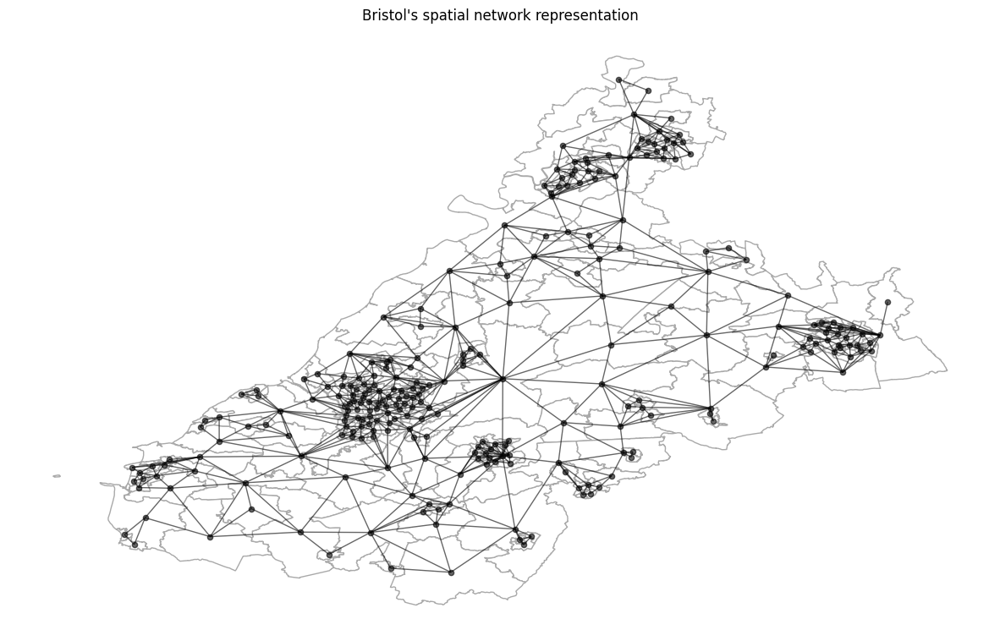

In [11]:
from utils.geodataframe import get_geodataframe_coordinates_dict
from utils.graphics import plot_spatial_network

plot_spatial_network(gdf, spatial_network, title=f"{CITY_NAME}'s spatial network representation")

In [12]:
from utils.temporal_network import get_movement_dataframe

df = get_movement_dataframe(TRAVEL_TIMES_DATA_PATH)

print(f"{CITY_NAME}'s movement dataframe:")
df.head()

Bristol's movement dataframe:


,sourceid,dstid,hod,mean_travel_time
0,142,151,7,1168.63
1,143,141,7,945.62
2,184,44,22,872.83
3,144,131,7,841.83
4,16,93,11,663.19


In [13]:
from utils.temporal_network import get_temporal_networks_from_pandas_edgelist

temporal_networks_dict = get_temporal_networks_from_pandas_edgelist(df, [0, 8, 13, 20])

In [14]:
for k, v in temporal_networks_dict.items():
   print(f'Temporal network at time {k}: nodes: {len(v.nodes())} edges: {len(v.edges())}') 

Temporal network at time 0: nodes: 193 edges: 5435
Temporal network at time 8: nodes: 191 edges: 6458
Temporal network at time 13: nodes: 200 edges: 5711
Temporal network at time 20: nodes: 198 edges: 6546


In [15]:
for k, v in temporal_networks_dict.items():
    print(f'Temporal network at time {k} is directed: {nx.is_directed(v)}') 

Temporal network at time 0 is directed: True
Temporal network at time 8 is directed: True
Temporal network at time 13 is directed: True
Temporal network at time 20 is directed: True


# Metric Node degree

In [16]:
import numpy as np
from typing import Dict
import matplotlib.pyplot as plt

from utils.metrics import normalize_centrality_measures


def plot_temporal_network_centrality_distribution(centralities: Dict[int, Dict[str, float]], metric: str):
    centralities = normalize_centrality_measures(centralities)

    # Histogram of the sentences length distribution
    histograms = dict()
    bins = dict()
    
    for k, v in centralities.items():
        hist, bin_edges = np.histogram(list(v.values()), bins=20, density=False, range=(0., 1.))
        histograms[k] = hist
        bins[k] = bin_edges
    
    width = 0.7 * (bins[0][1] - bins[0][0])
    center = (bins[0][:-1] + bins[0][1:]) / 2
    
    cmap = plt.get_cmap('tab10')
    ylim = max([max(v) for v in histograms.values()])

    plt.figure(figsize=(15, 10))
        
    for i, k in enumerate(centralities.keys()):
        plt.subplot(2, 2, i + 1)  
        plt.xticks(bin_edges[::2])
        plt.bar(center, histograms[k], width=width, color=cmap.colors[i])
        plt.ylim((0, ylim + 10))
        plt.xlabel('centrality')
        plt.title(f'Time {k:02d}:00')
        plt.grid(axis='y')
    
    #plt.tight_layout()
    plt.suptitle(f'{metric.capitalize()} distributions for the temporal graph')
    plt.show()
    
    cumsums = dict()
    bins = dict()
    
    for k, v in centralities.items():
        hist, bin_edges = np.histogram(list(v.values()), bins=20, density=True, range=(0., 1.))
        cumsums[k] = np.cumsum(hist) * (bin_edges[1] - bin_edges[0])
        bins[k] = bin_edges
    center = (bins[0][:-1] + bins[0][1:]) / 2

    # Cumulative distribution of the sentences length
    plt.figure(figsize=(10,5))
    plt.xticks(bin_edges[::2])
    for k, v in cumsums.items():
        plt.plot(center, v, 'o-', label=f'Time {k:2d}:00')
    plt.suptitle(f'{metric.capitalize()} cumulative distributions for the temporal graph')
    plt.xlabel('centrality')
    plt.grid(axis='y')
    plt.legend(loc='lower center', ncol=len(cumsums), bbox_to_anchor=(.5, -.25),
          columnspacing=7)
    plt.show()
    
def plot_spatial_network_centrality_distribution(centralities: Dict[str, float], metric: str):
    hist, bin_edges = np.histogram(list(centralities.values()), bins=20, density=False, range=(0., 1.))
    
    width = 0.7 * (bin_edges[1] - bin_edges[0])
    center = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    cmap = plt.get_cmap('tab10')

    plt.figure(figsize=(15, 5))
        
    plt.subplot(1, 2, 1)  
    plt.xticks(bin_edges[::2])
    plt.bar(center, hist, width=width, color=cmap.colors[0])
    plt.xlabel('centrality')
    plt.title(f'{metric.capitalize()} distribution for the spatial network ')
    plt.grid(axis='y')
    
    hist, bin_edges = np.histogram(list(centralities.values()), bins=20, density=True, range=(0., 1.))
    cumsum = np.cumsum(hist) * (bin_edges[1] - bin_edges[0])
    center = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Cumulative distribution of the sentences length
    plt.subplot(1, 2, 2) 
    plt.xticks(bin_edges[::2])
    plt.plot(center, cumsum, 'o-')
    plt.title(f'{metric.capitalize()} cumulative distribution for the spatial network')
    plt.xlabel('centrality')
    plt.grid(axis='y')
    plt.show()

### In-deg Temporal

In [17]:
from utils.metrics import get_nodes_centrality

temporal_networks_in_degrees = {
    k: get_nodes_centrality(v, 'in-deg', weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

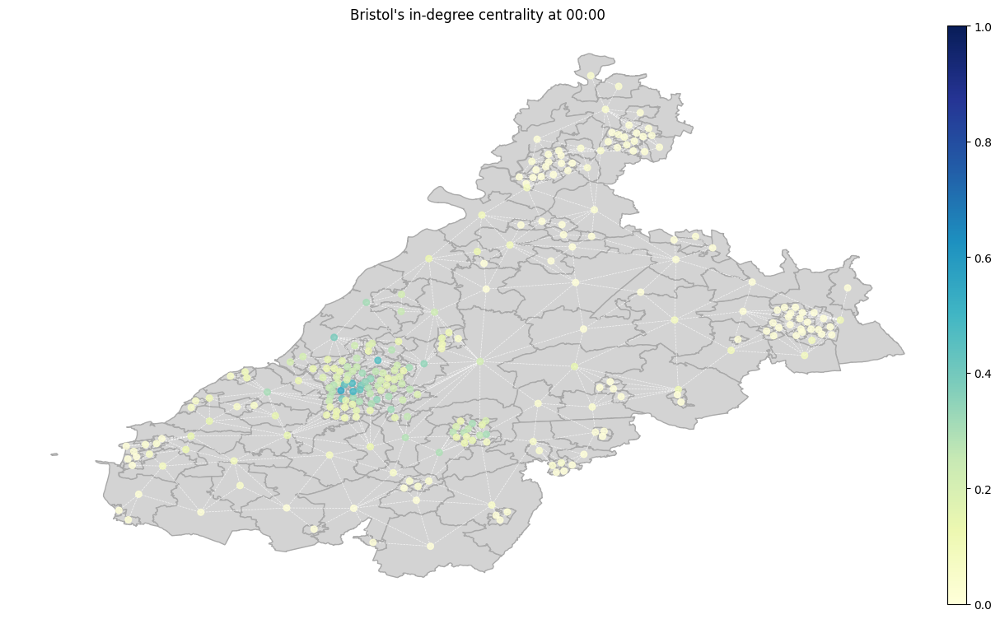

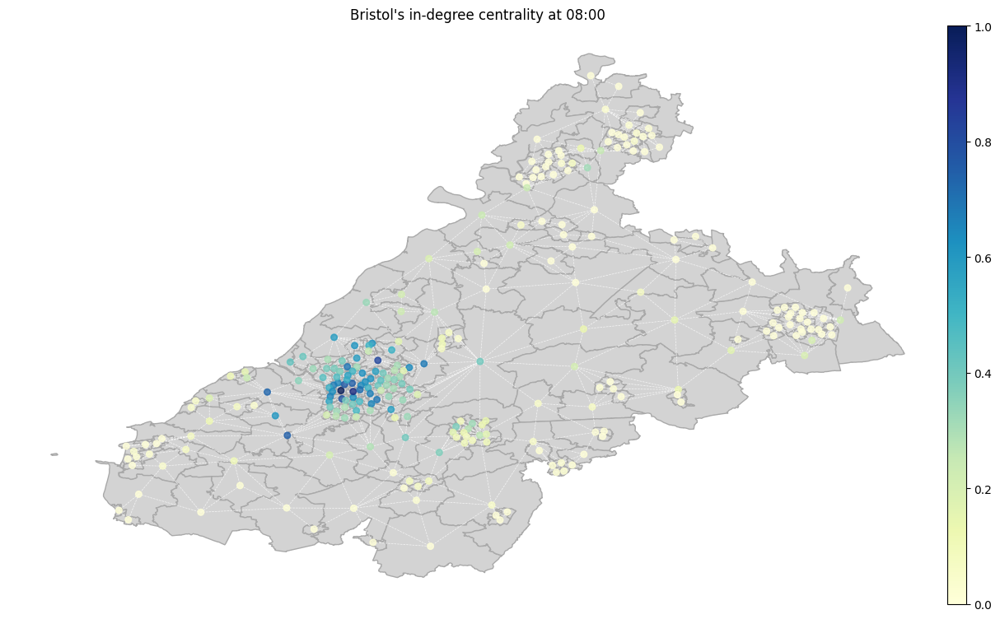

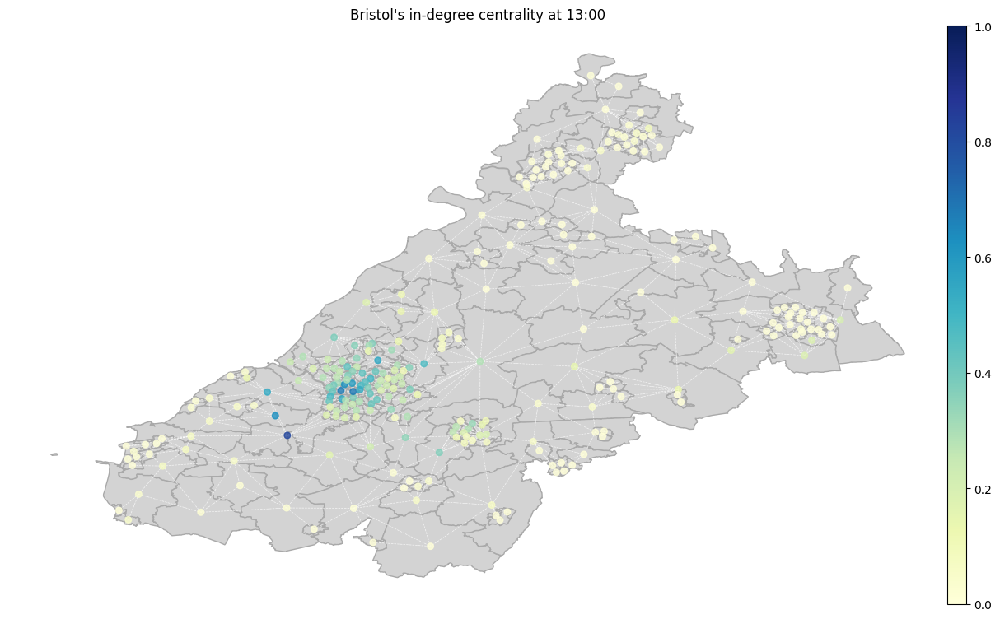

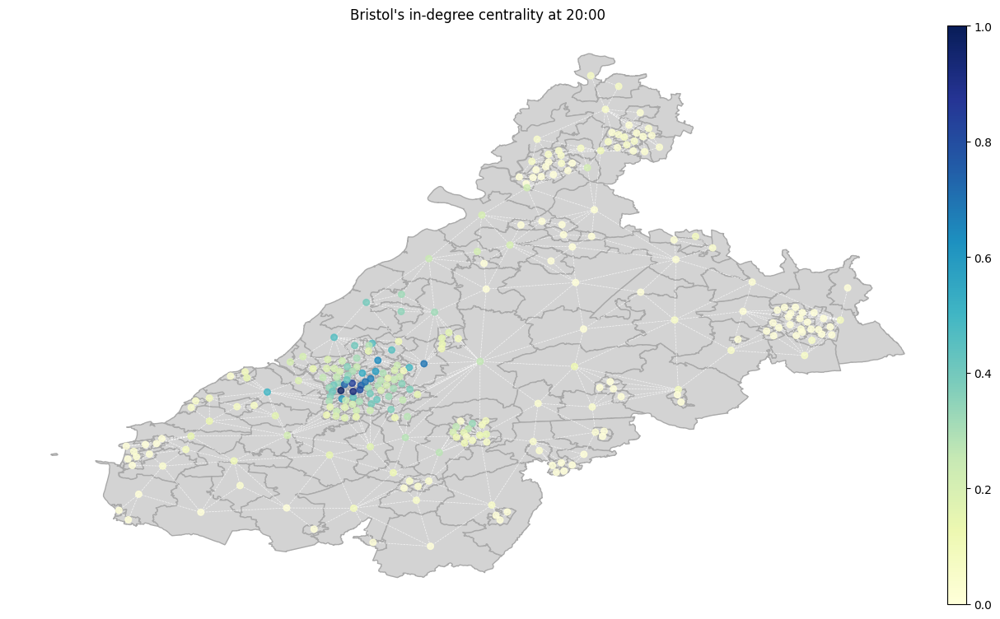

In [18]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_in_degrees, CITY_NAME, 'in-degree')

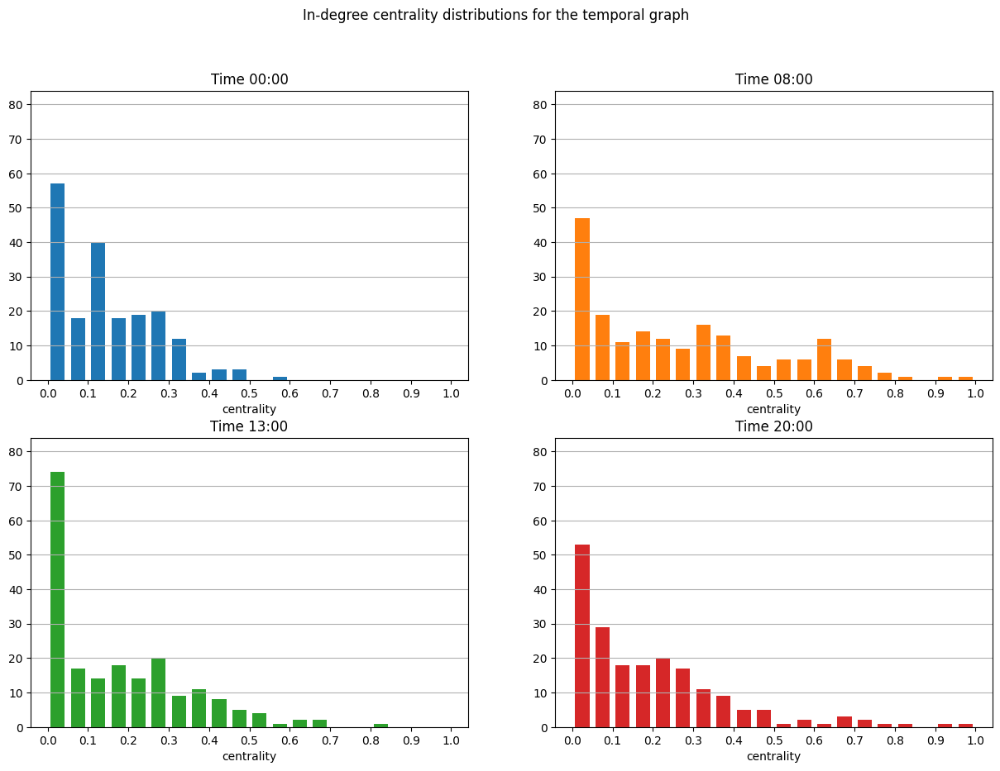

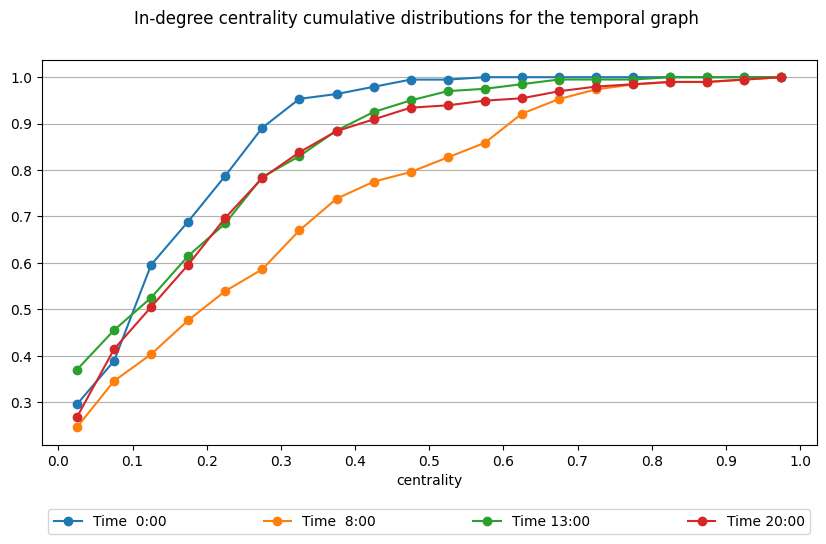

In [19]:
plot_temporal_network_centrality_distribution(temporal_networks_in_degrees, 'in-degree centrality')

## Out-degree temporal

In [20]:
from utils.metrics import get_nodes_centrality

temporal_networks_out_degrees = {
    k: get_nodes_centrality(v, 'out-deg', weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

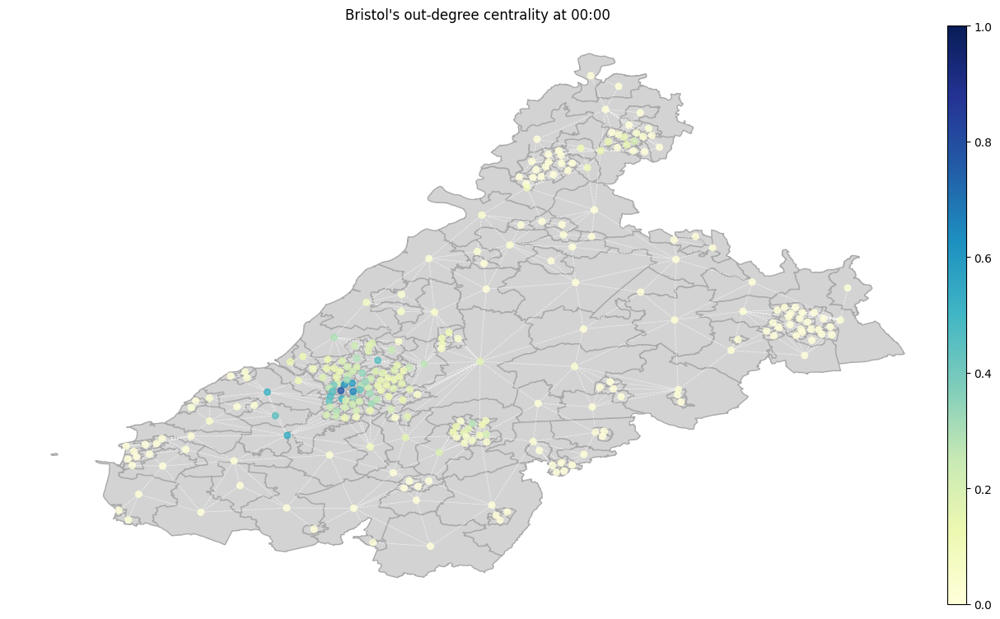

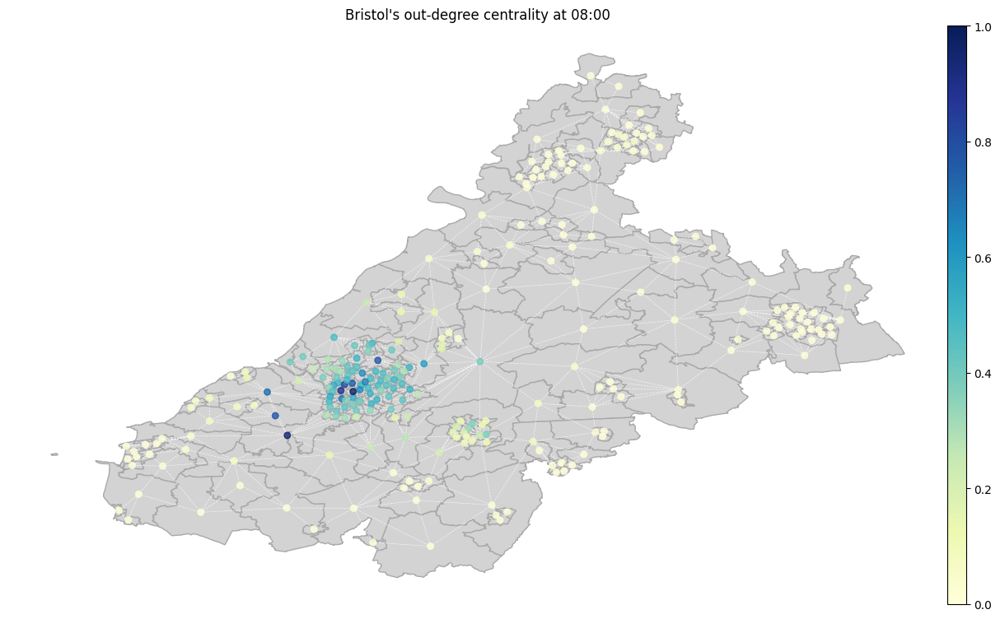

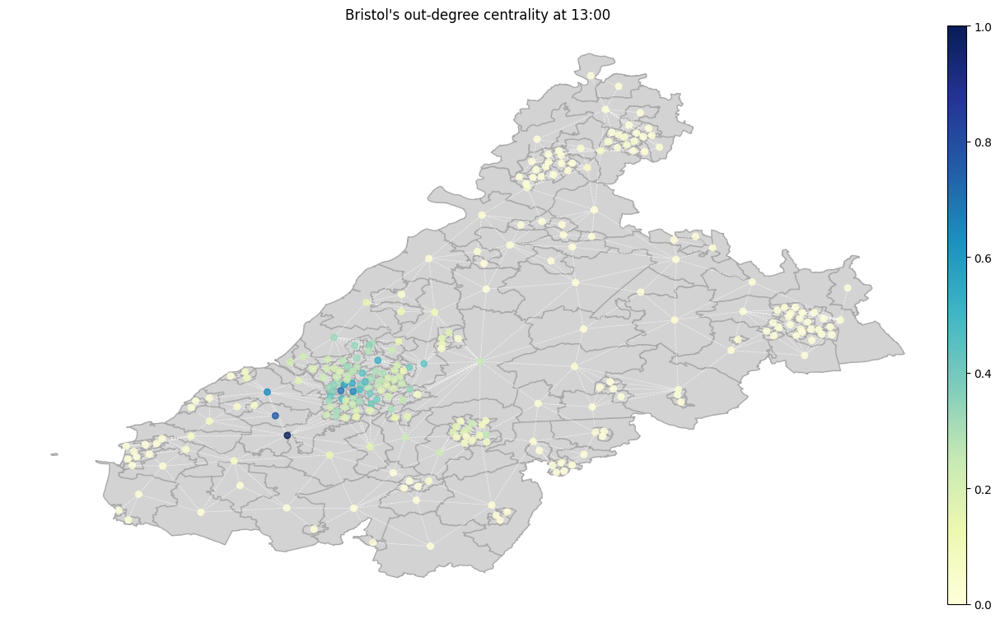

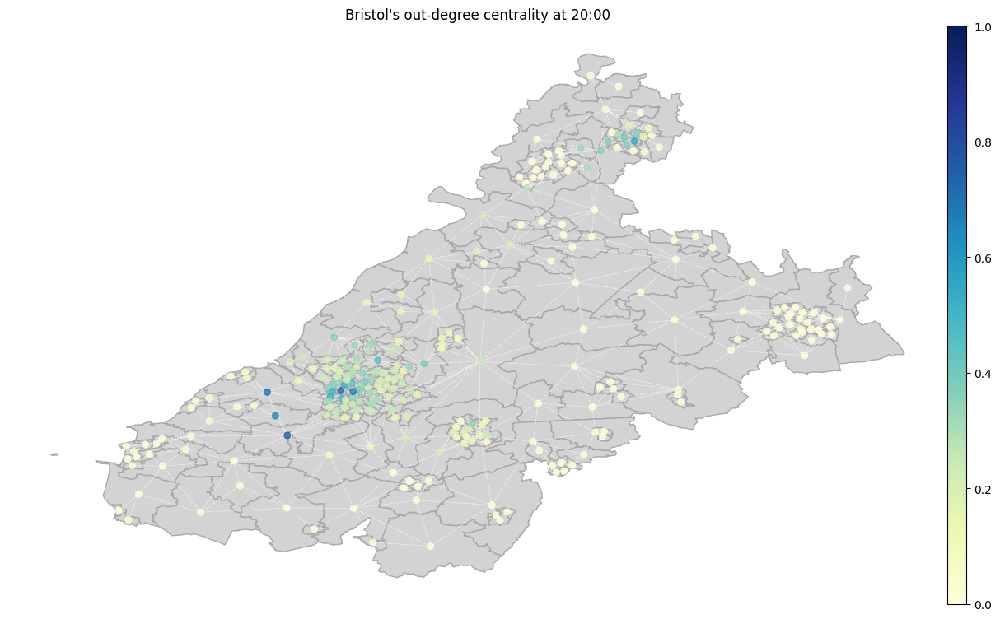

In [21]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_out_degrees, CITY_NAME, 'out-degree')

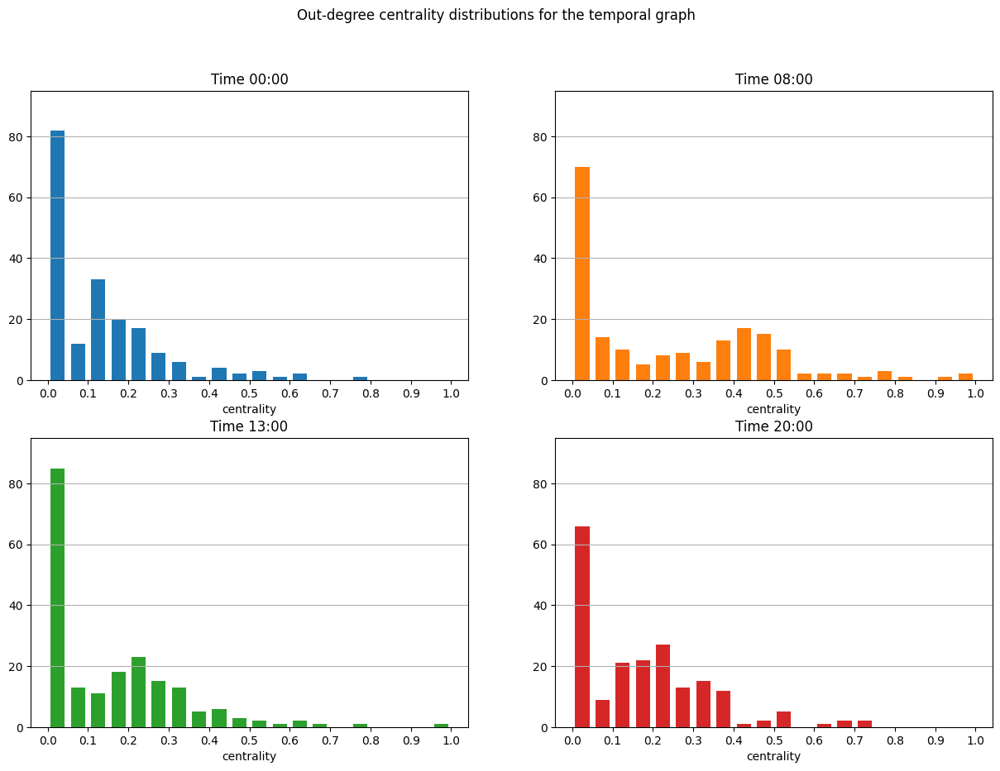

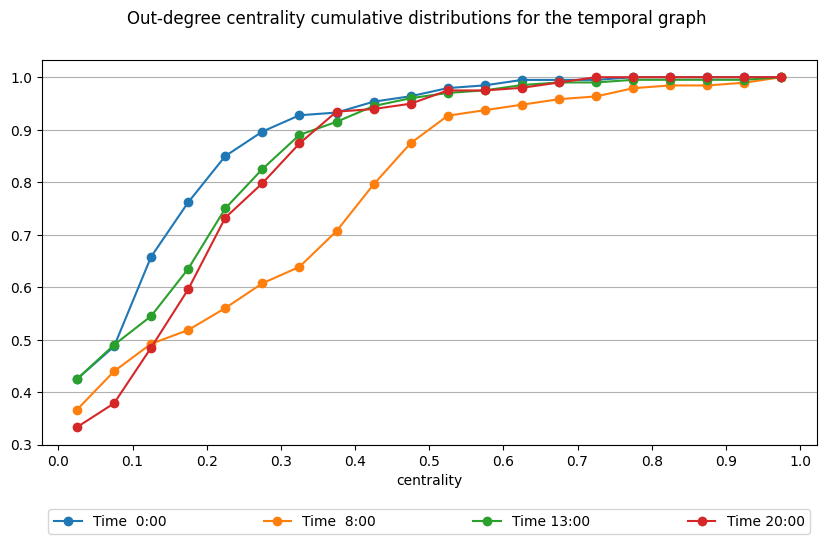

In [22]:
plot_temporal_network_centrality_distribution(temporal_networks_out_degrees, 'out-degree centrality')

## Betweenness temporal

In [23]:
from utils.metrics import get_nodes_centrality

temporal_networks_betweenness = {
    k: get_nodes_centrality(v, 'betweenness', weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

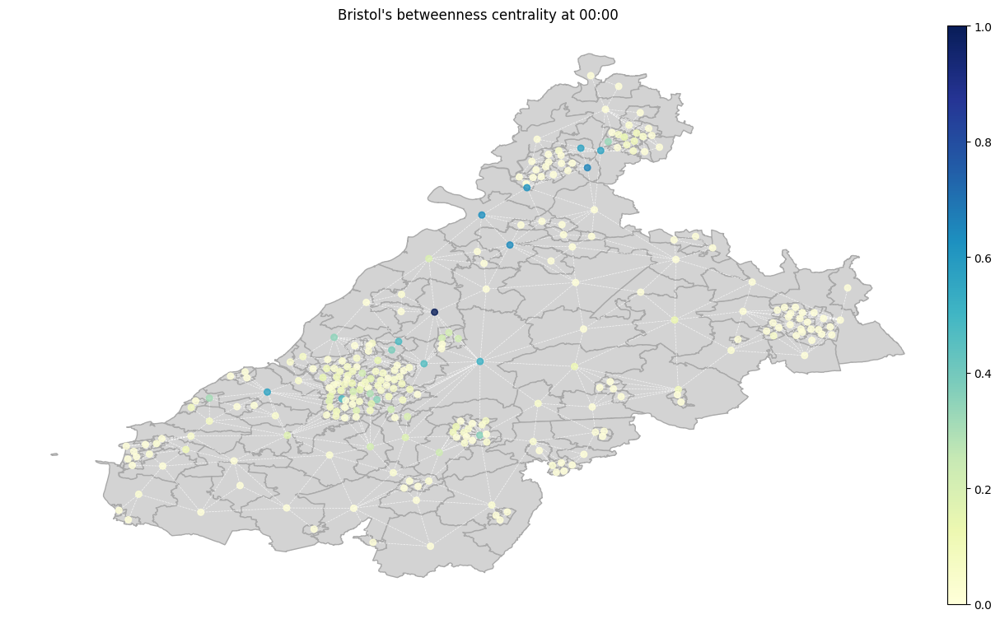

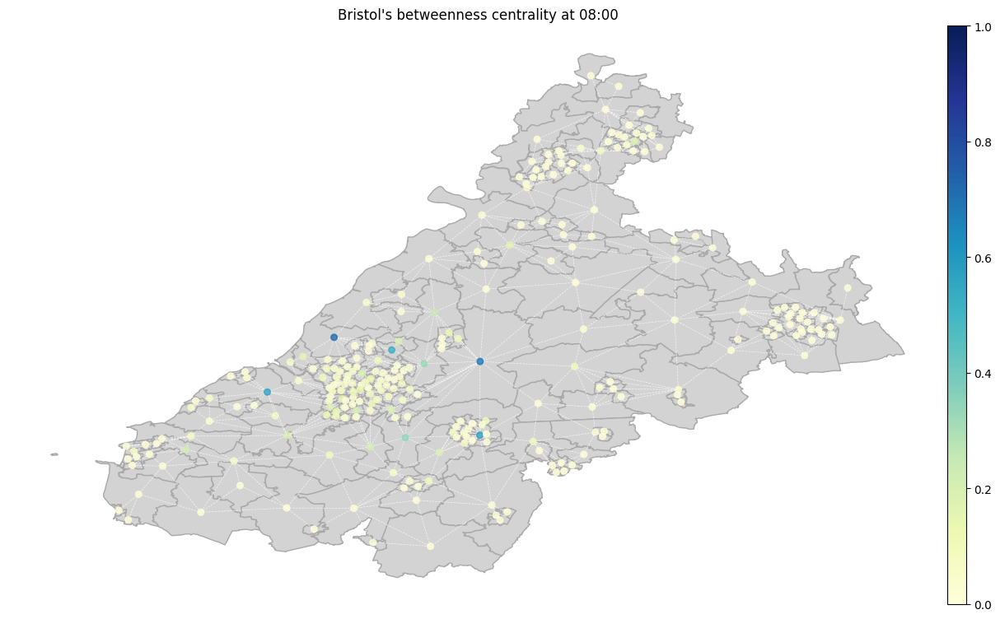

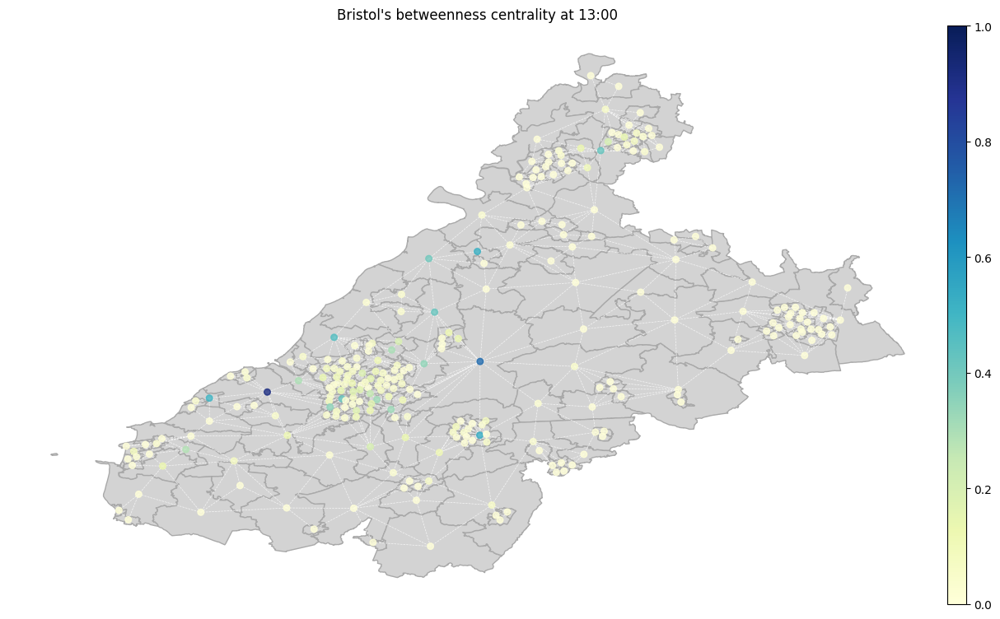

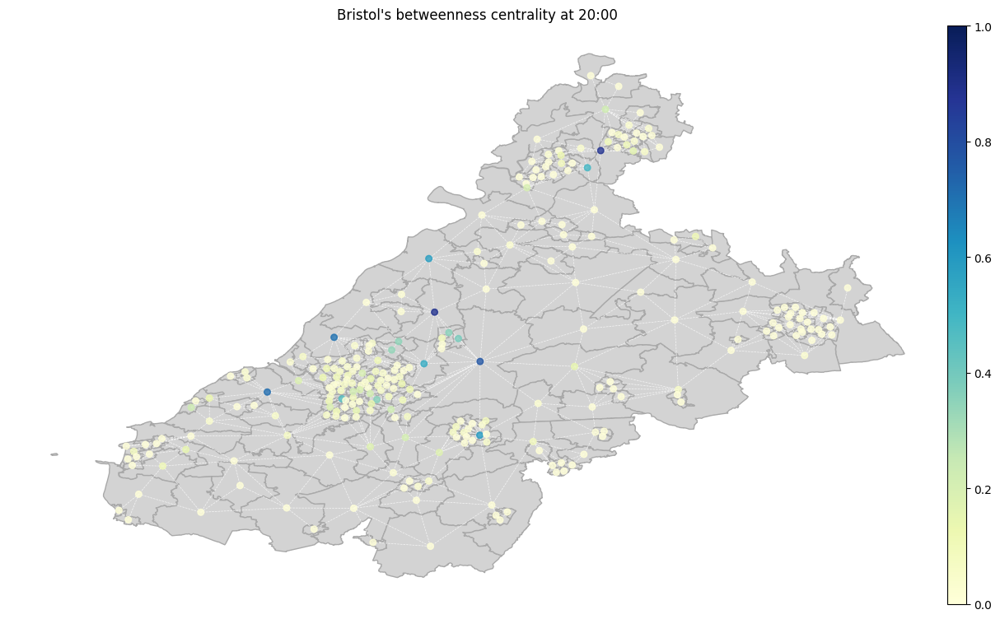

In [24]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_betweenness, CITY_NAME, 'betweenness')

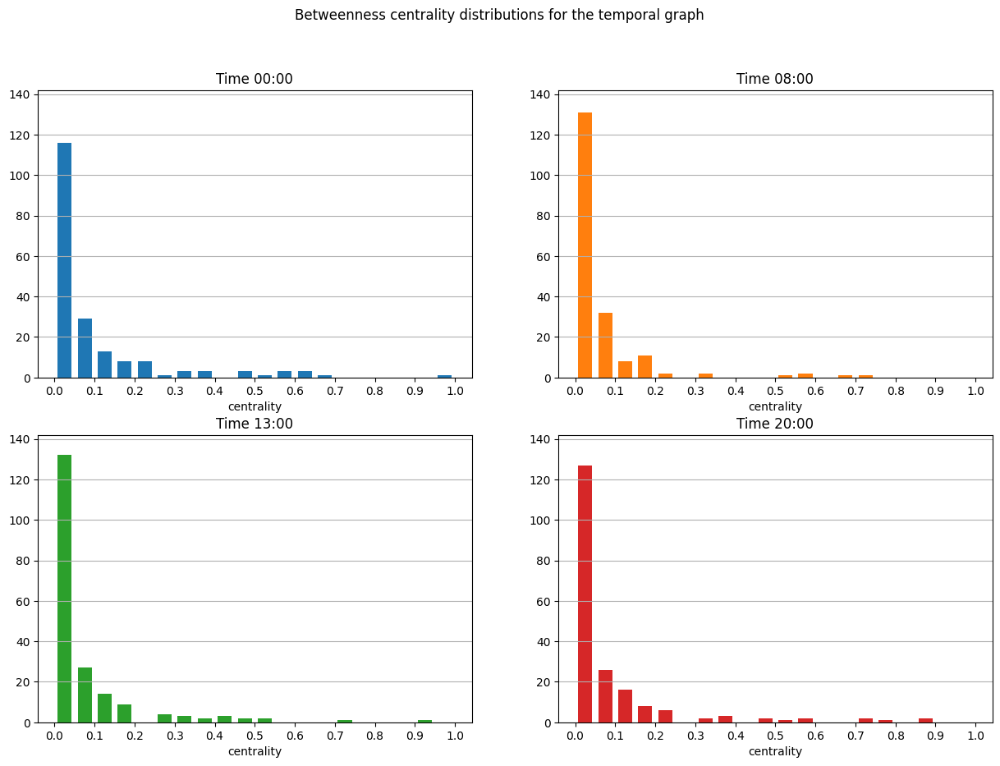

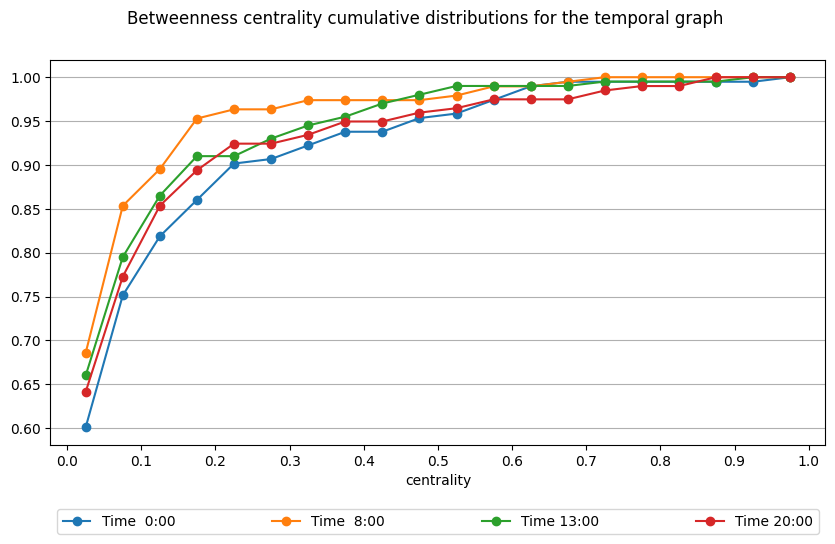

In [25]:
plot_temporal_network_centrality_distribution(temporal_networks_betweenness, 'betweenness centrality')

In [26]:
from utils.metrics import get_nodes_centrality

spatial_network_betweenness = get_nodes_centrality(spatial_network, 'betweenness', weight='weight',
                                                   normalize=True)

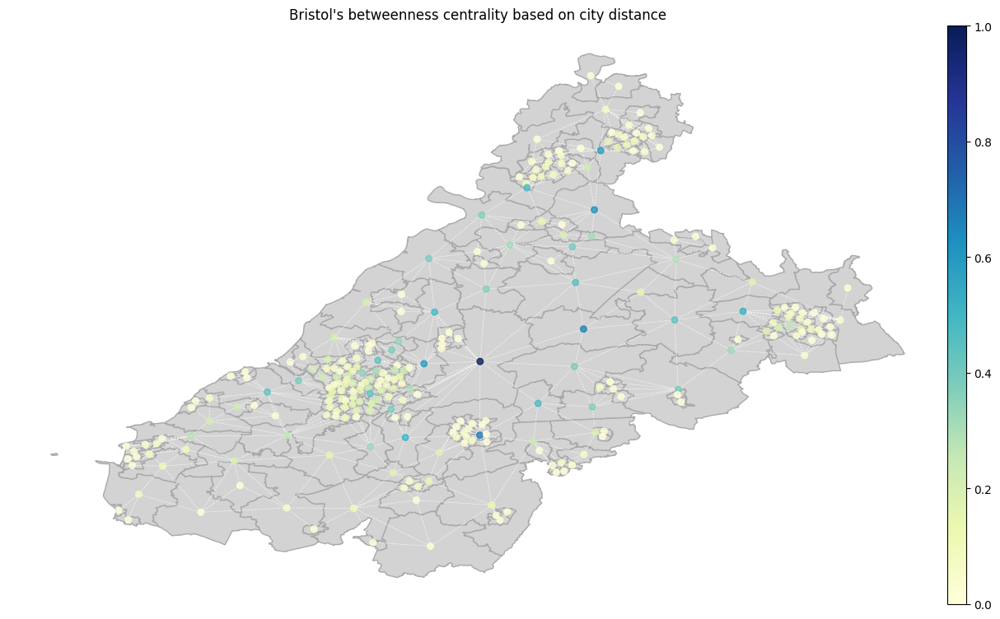

In [27]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_betweenness,
                title = f"{CITY_NAME}'s betweenness centrality based on city distance")

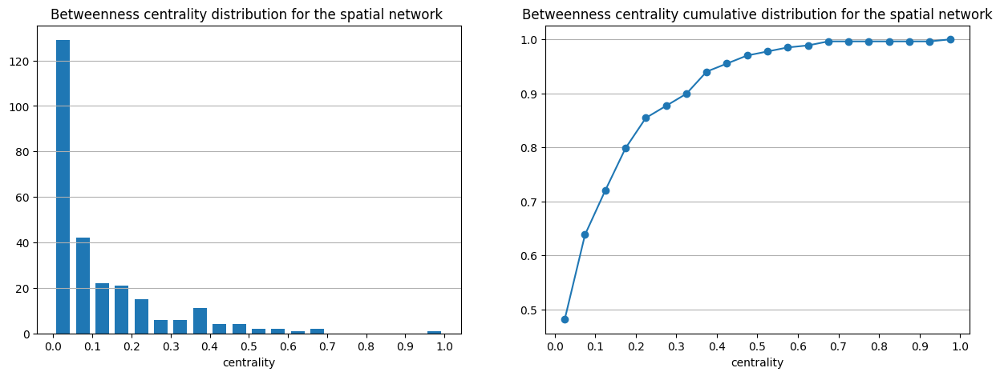

In [28]:
plot_spatial_network_centrality_distribution(spatial_network_betweenness, 'betweenness centrality')

## Closeness

In [29]:
from utils.metrics import get_nodes_centrality

temporal_networks_closeness = {
    k: get_nodes_centrality(v, 'closeness', weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

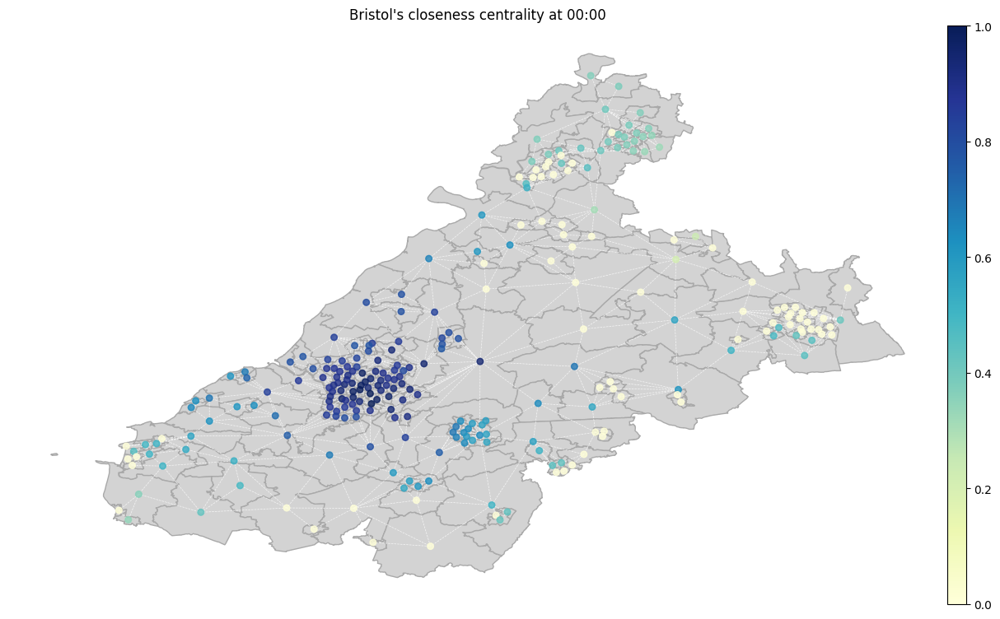

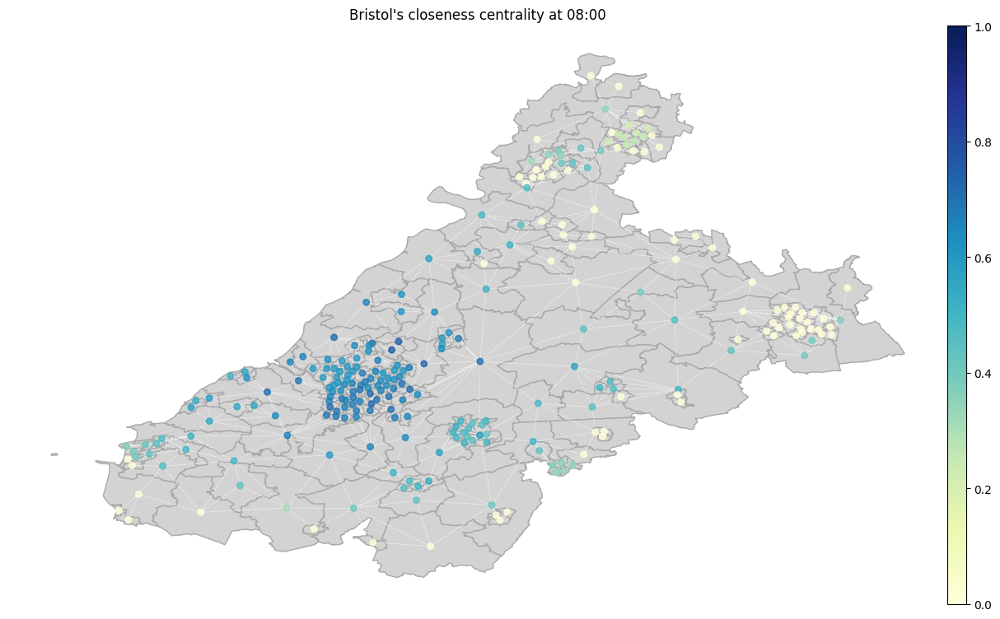

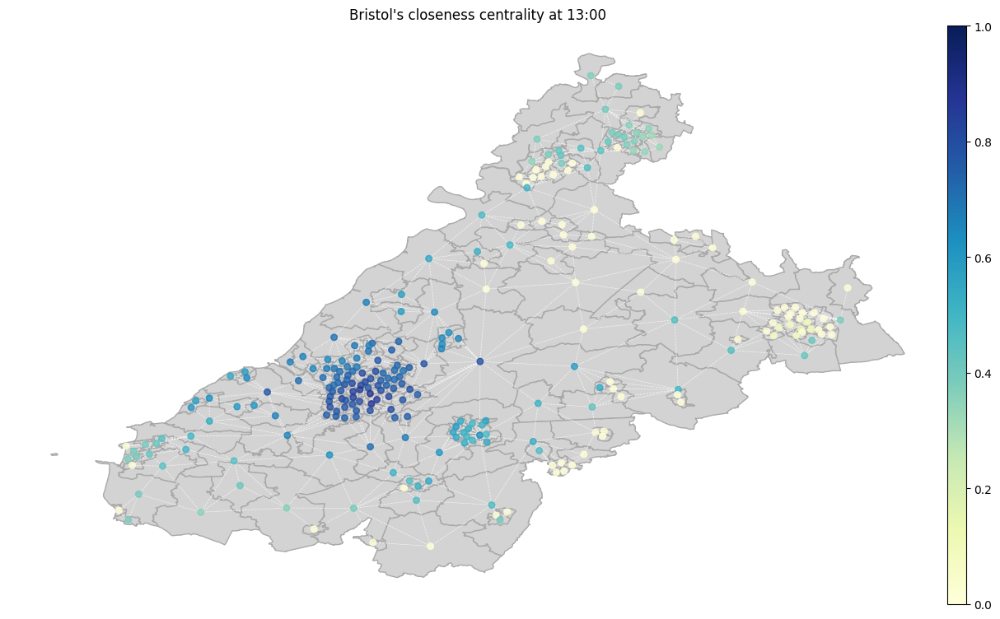

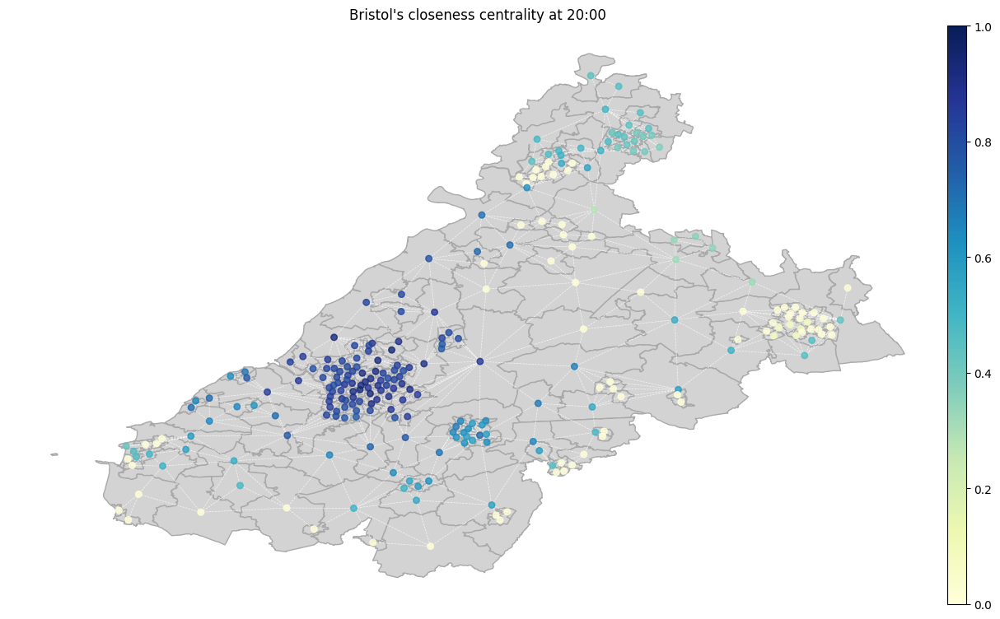

In [30]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_closeness, CITY_NAME, 'closeness')


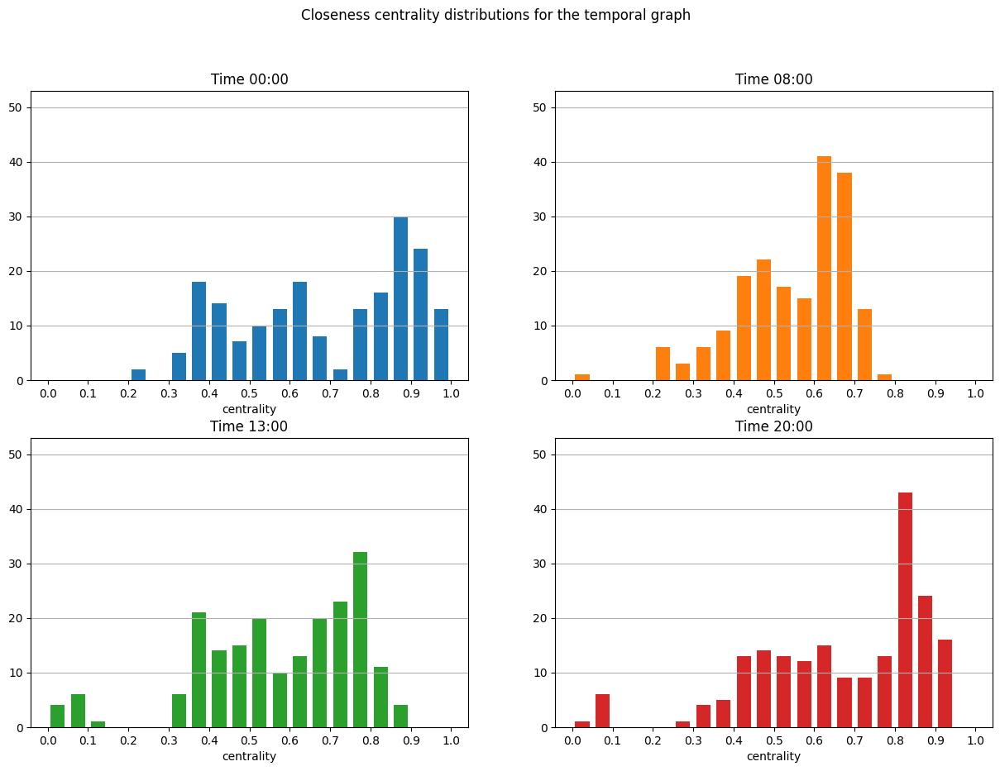

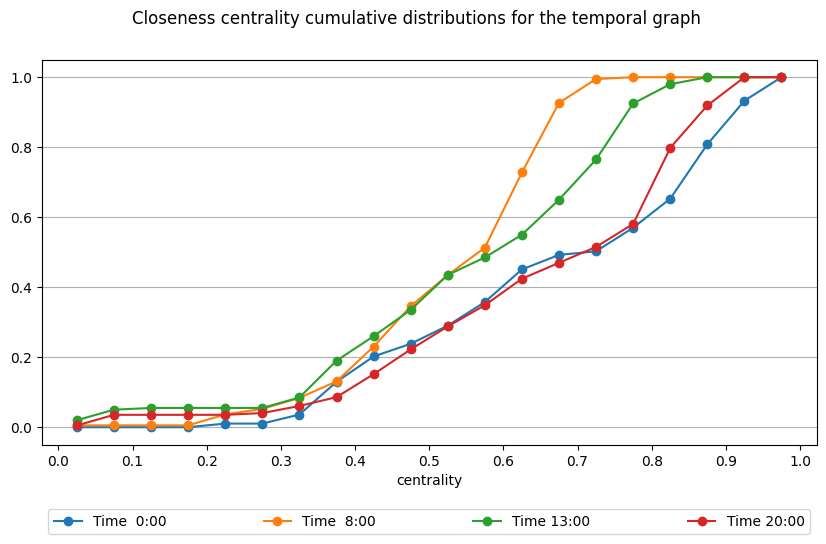

In [31]:
plot_temporal_network_centrality_distribution(temporal_networks_closeness, 'closeness centrality')

In [32]:
from utils.metrics import get_nodes_centrality

spatial_network_closeness = get_nodes_centrality(spatial_network, 'closeness', weight='weight',
                                                 normalize=True)

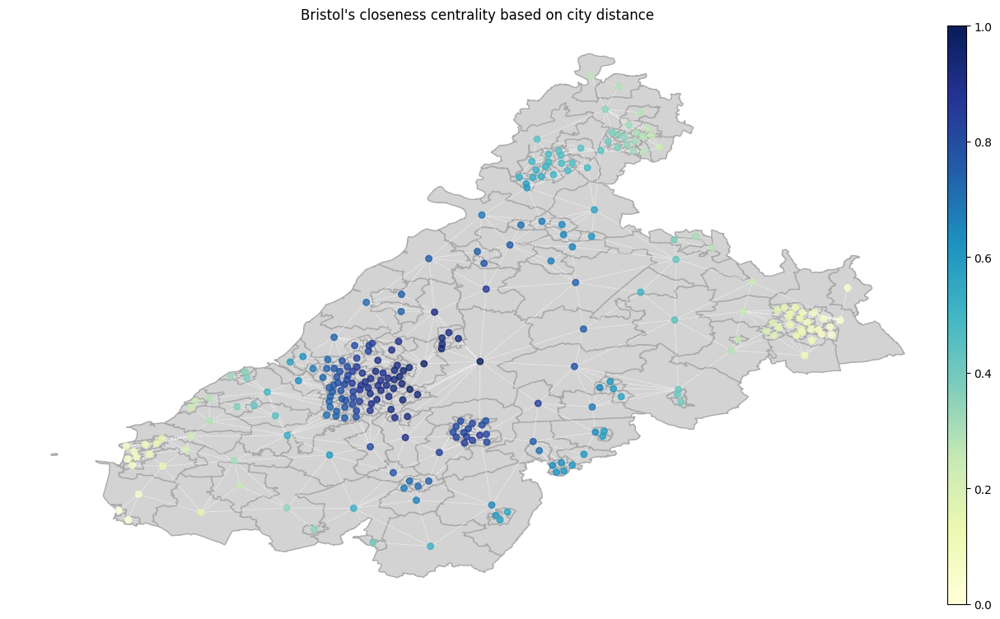

In [33]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_closeness,
                title=f"{CITY_NAME}'s closeness centrality based on city distance")


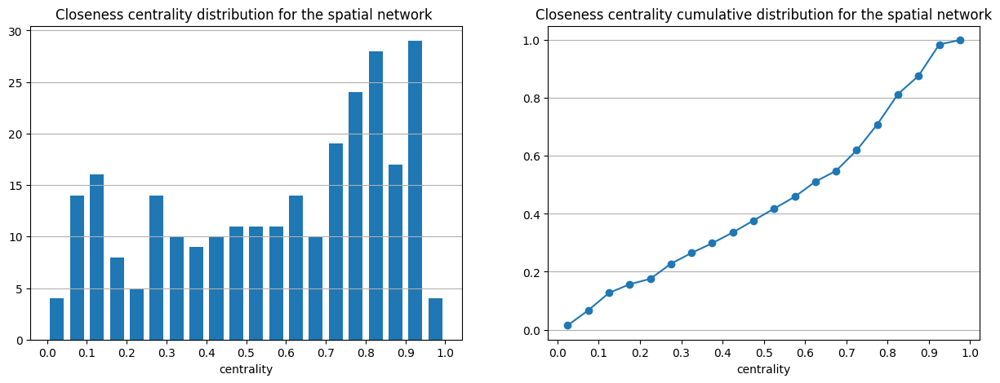

In [34]:
plot_spatial_network_centrality_distribution(spatial_network_closeness, 'closeness centrality')

## PageRank

In [35]:
from utils.metrics import get_nodes_centrality

temporal_networks_pagerank = {
    k: get_nodes_centrality(v, 'pagerank', weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

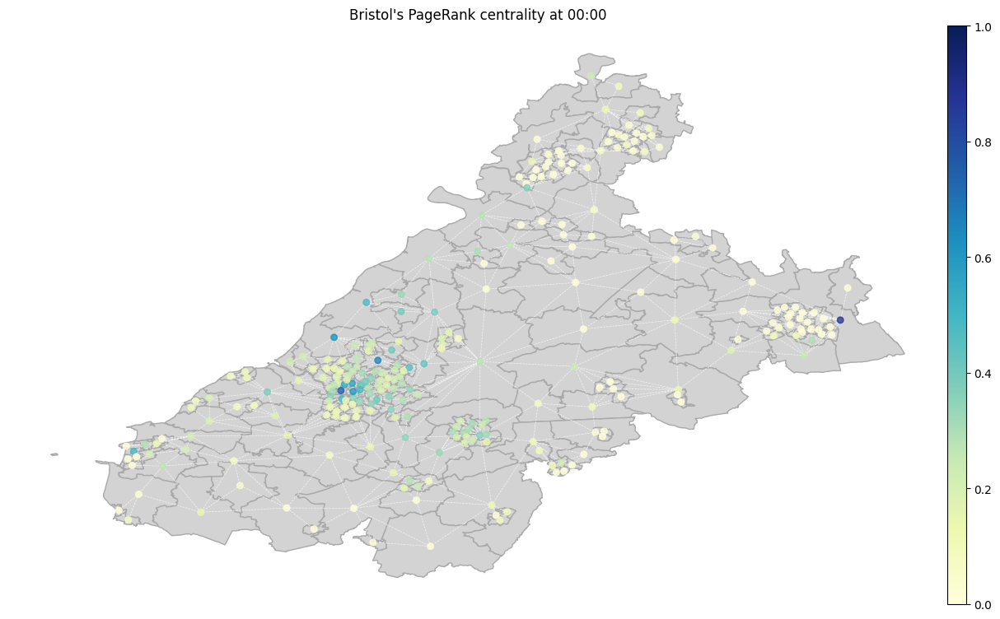

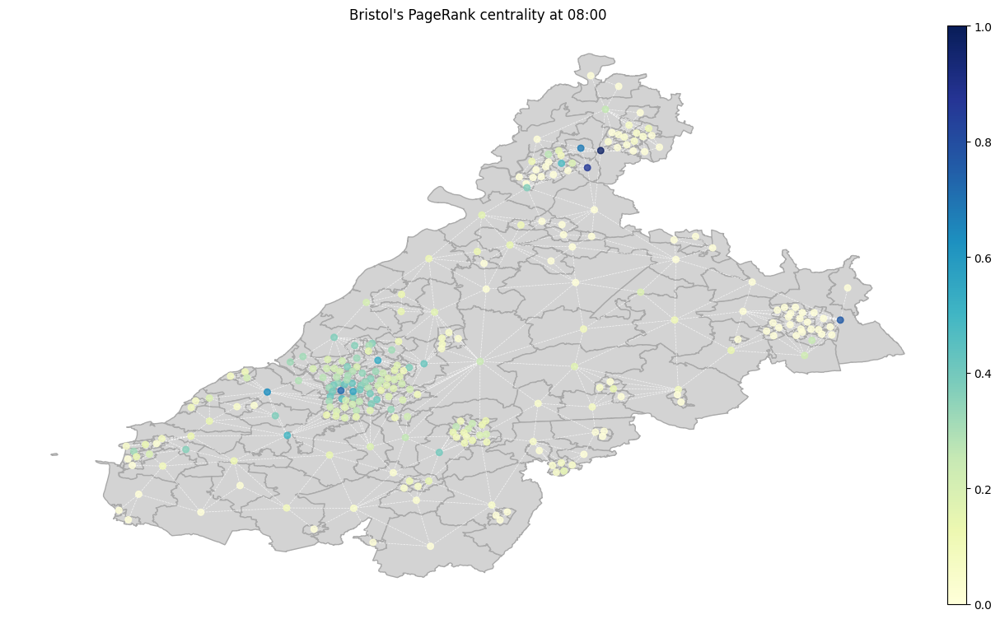

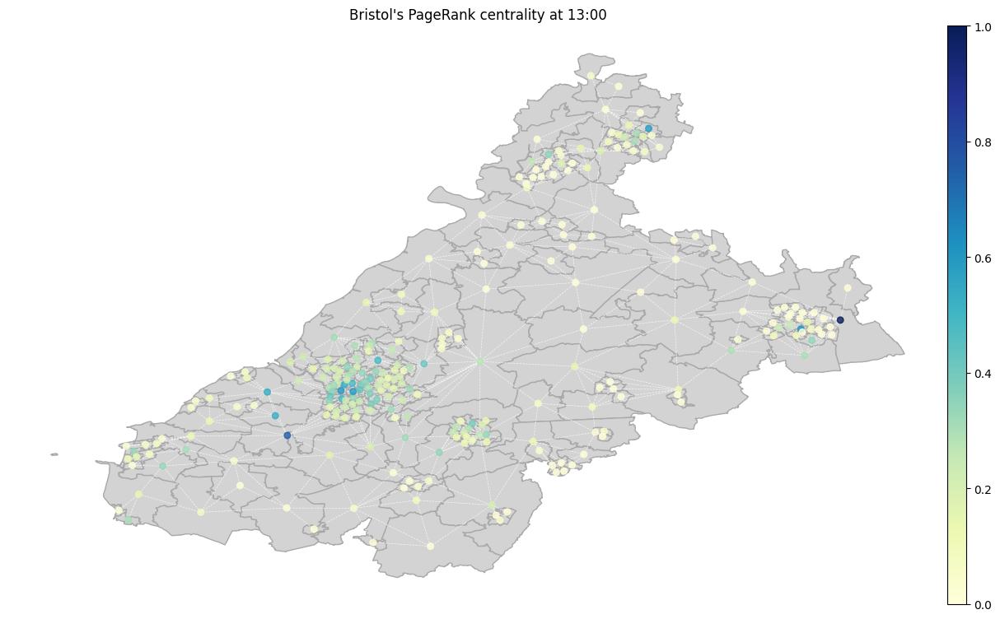

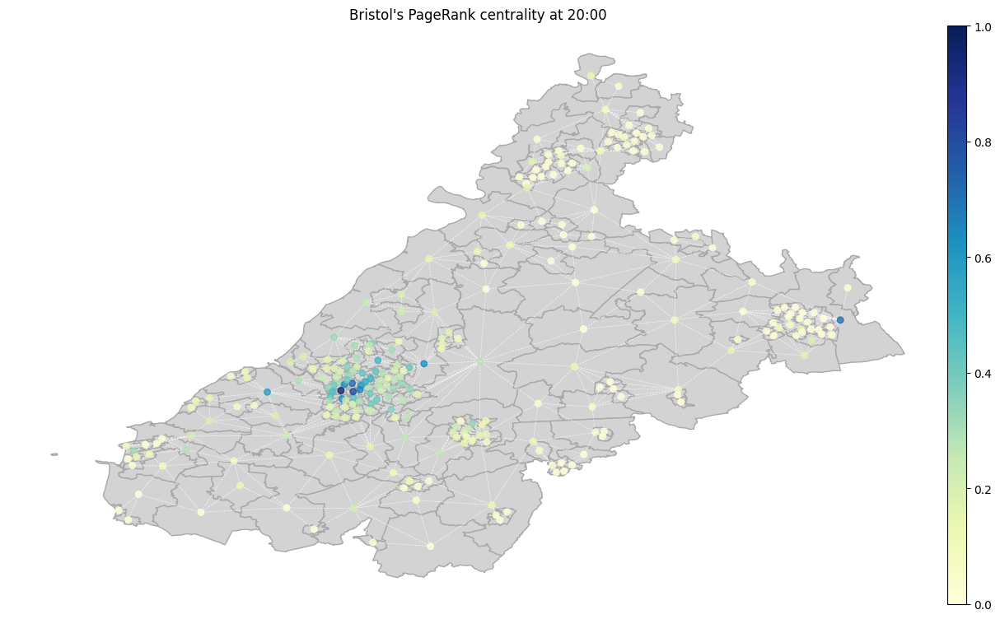

In [36]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_pagerank, CITY_NAME, 'PageRank')

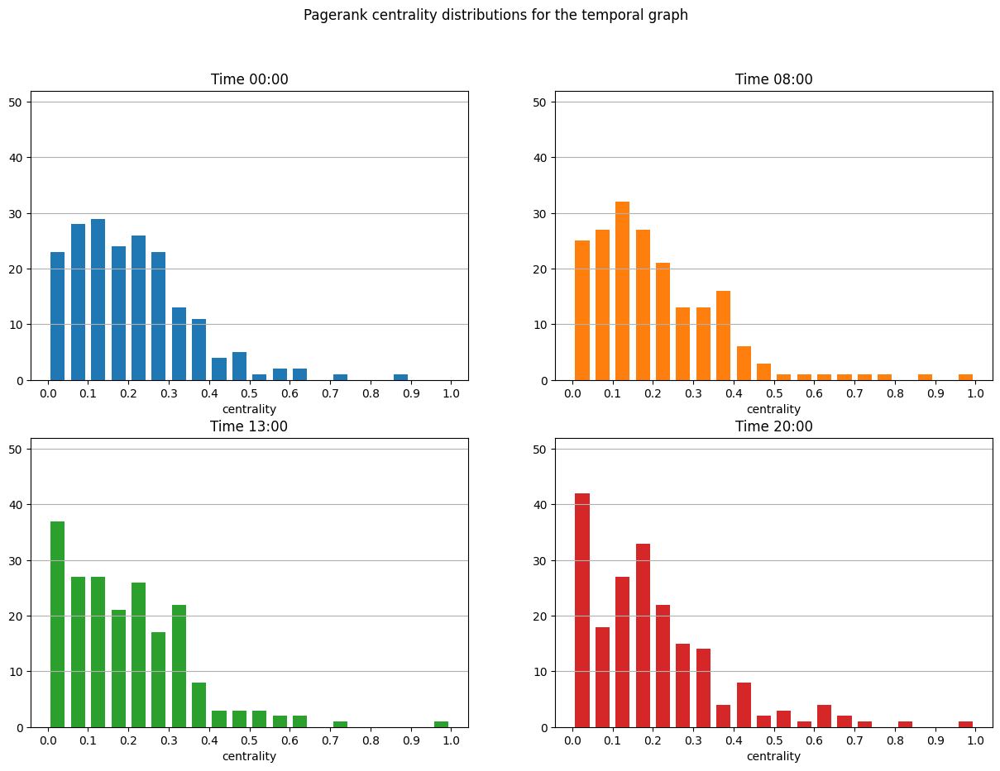

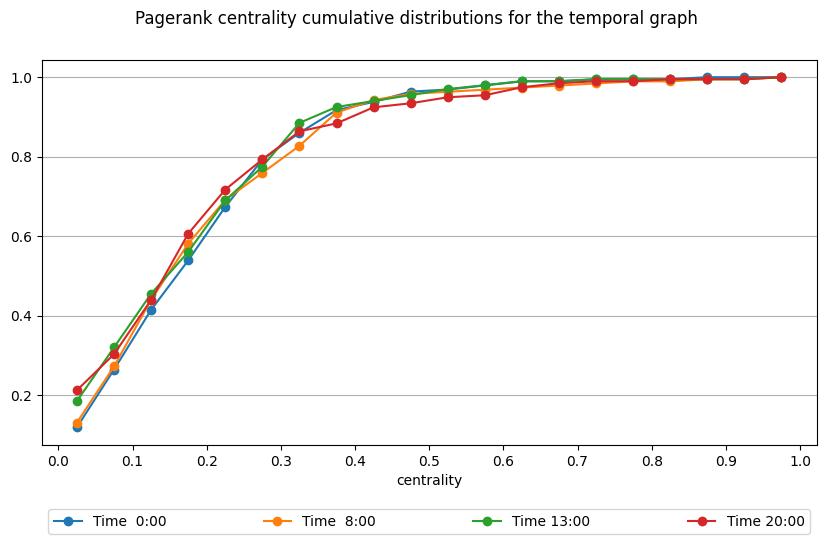

In [37]:
plot_temporal_network_centrality_distribution(temporal_networks_pagerank, 'PageRank centrality')

In [38]:
from utils.metrics import get_nodes_centrality

spatial_network_pagerank = get_nodes_centrality(spatial_network, 'pagerank', weight='weight', normalize=True)

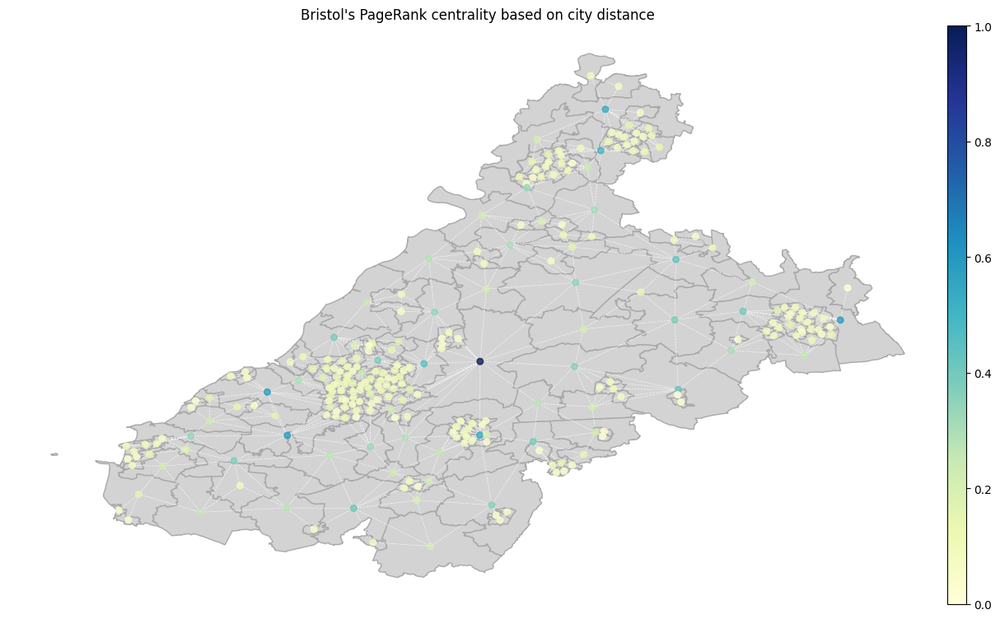

In [39]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_pagerank,
                title=f"{CITY_NAME}'s PageRank centrality based on city distance")


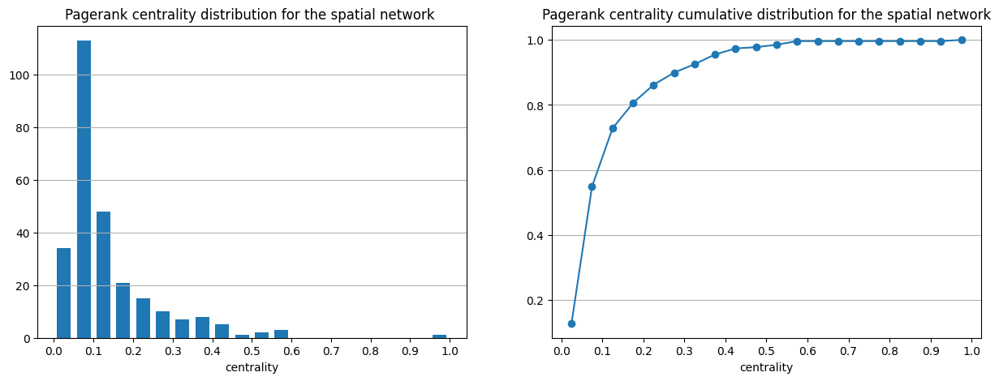

In [40]:
plot_spatial_network_centrality_distribution(spatial_network_pagerank, 'PageRank centrality')

## HITS

In [41]:
from utils.metrics import get_nodes_centrality

temporal_networks_hubs = dict()
temporal_networks_authorities = dict()

for k, v in temporal_networks_dict.items():
    hubs, authorities = get_nodes_centrality(v, 'hits', normalize=True, weight='mean_travel_time')
    temporal_networks_hubs[k] = hubs
    temporal_networks_authorities[k] = authorities

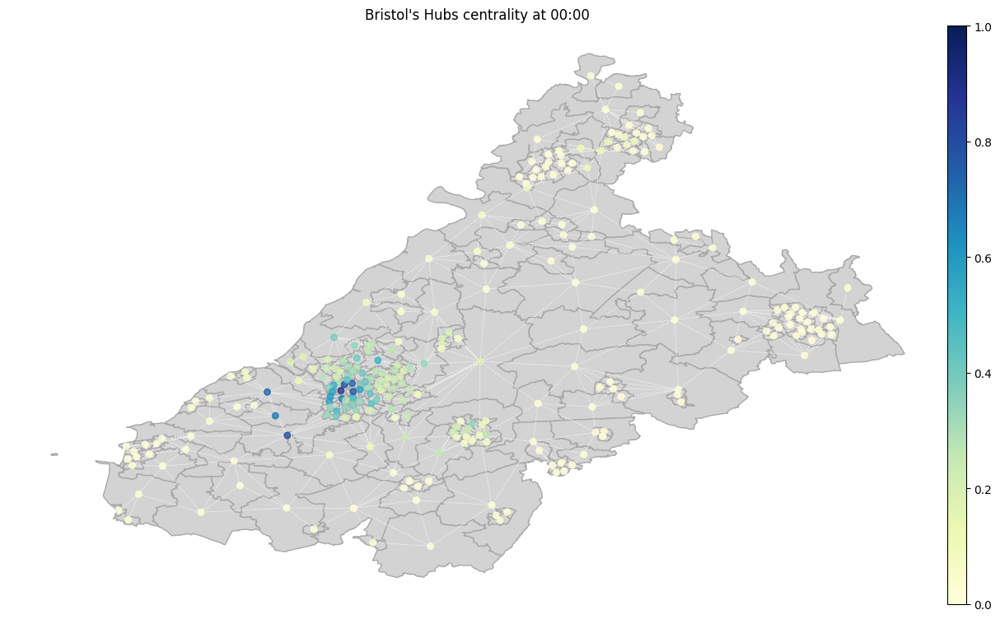

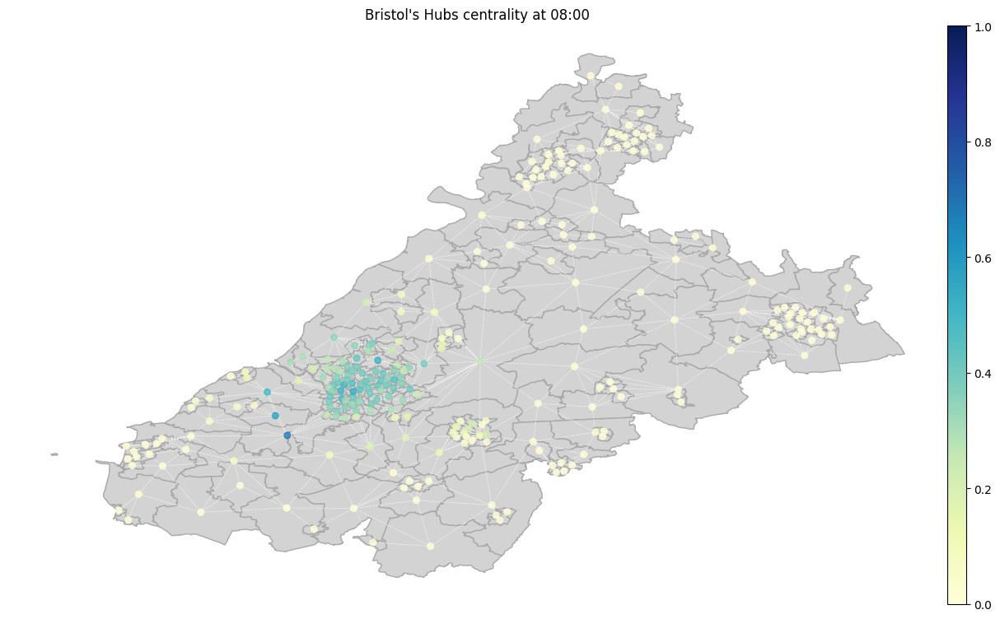

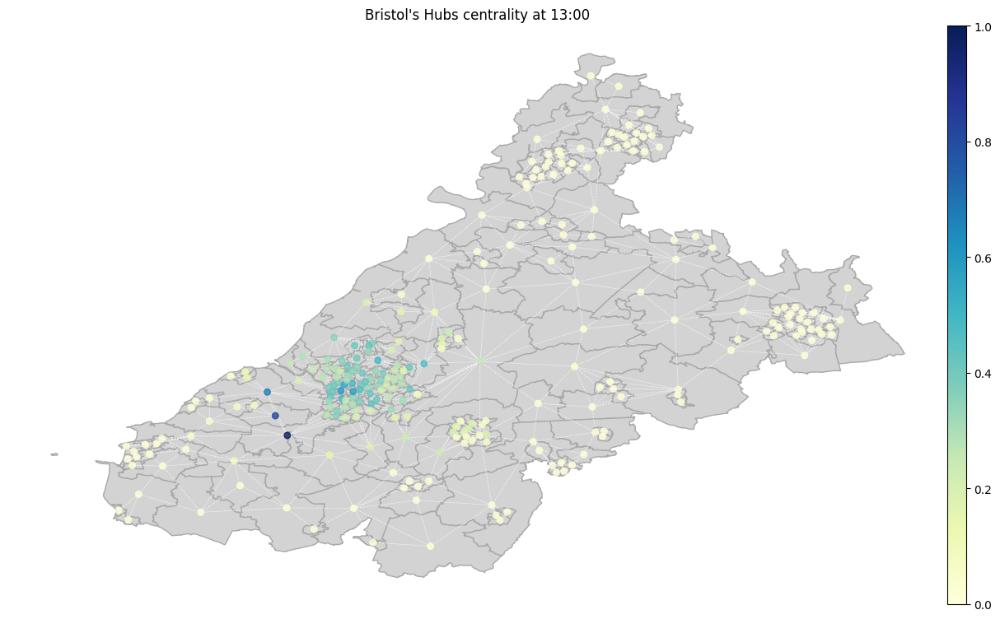

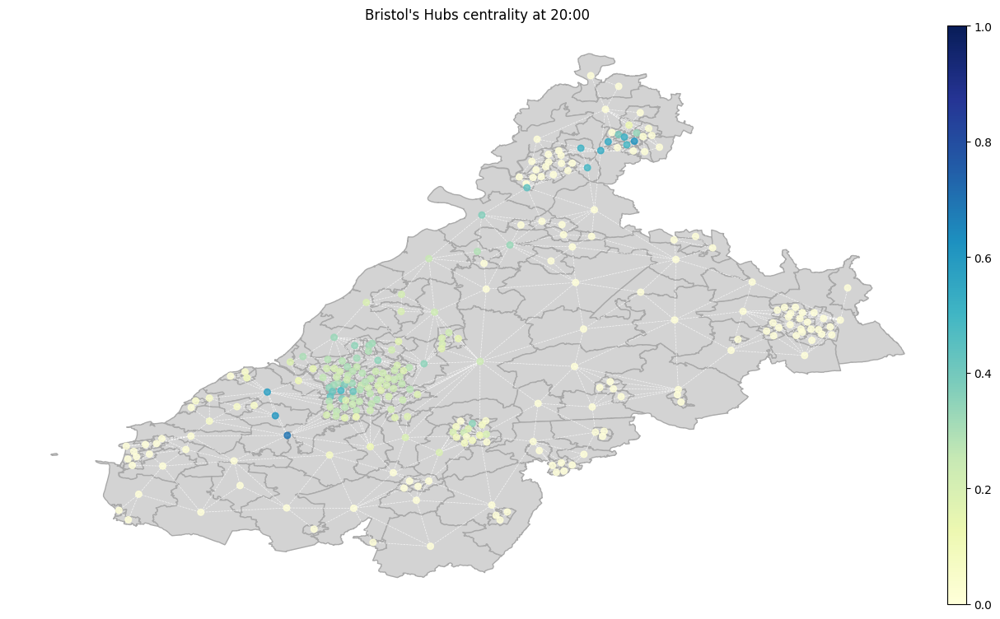

In [42]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_hubs, CITY_NAME, 'Hubs')

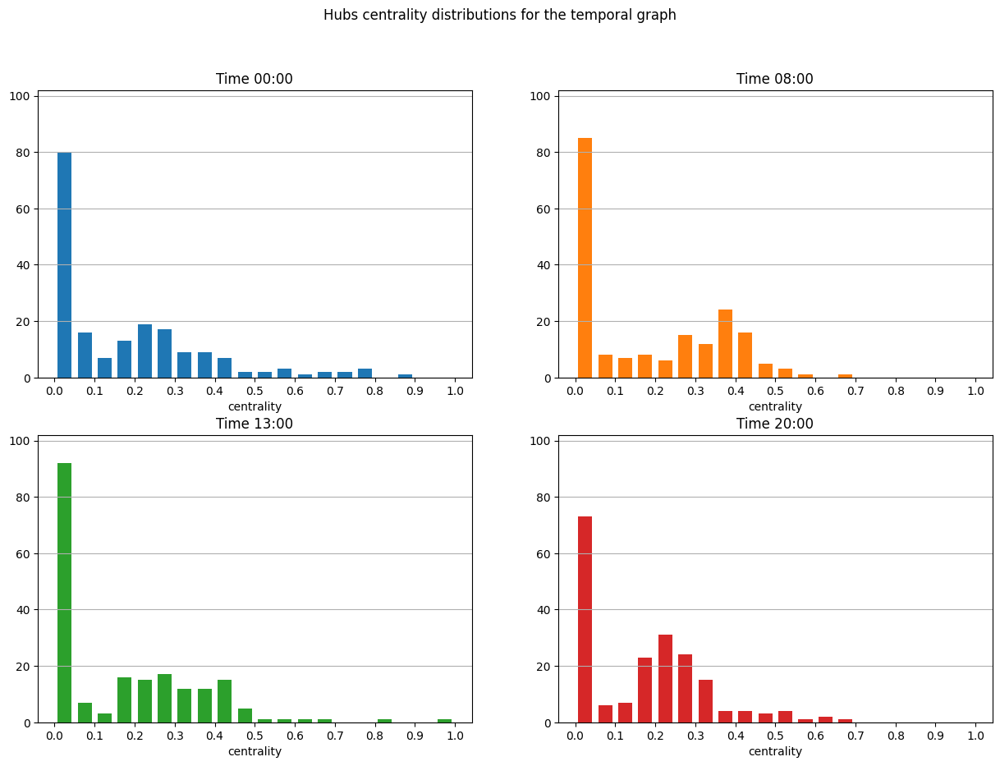

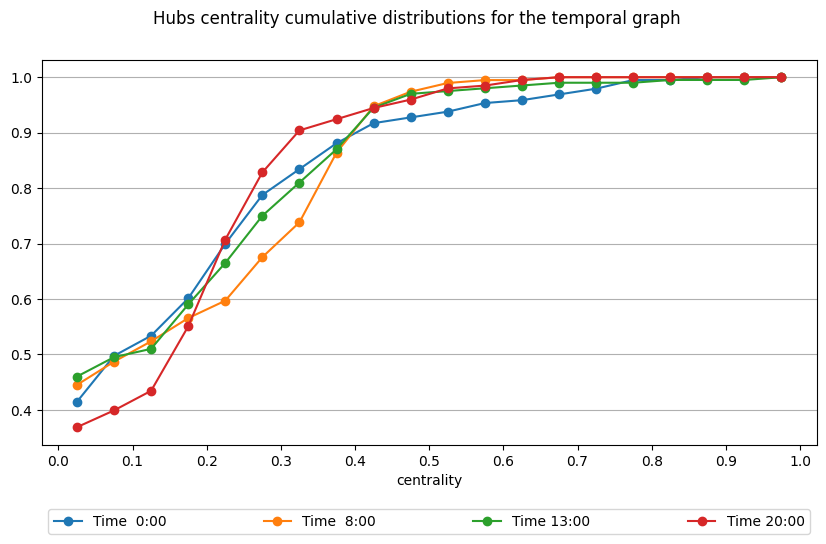

In [43]:
plot_temporal_network_centrality_distribution(temporal_networks_hubs, 'hubs centrality')

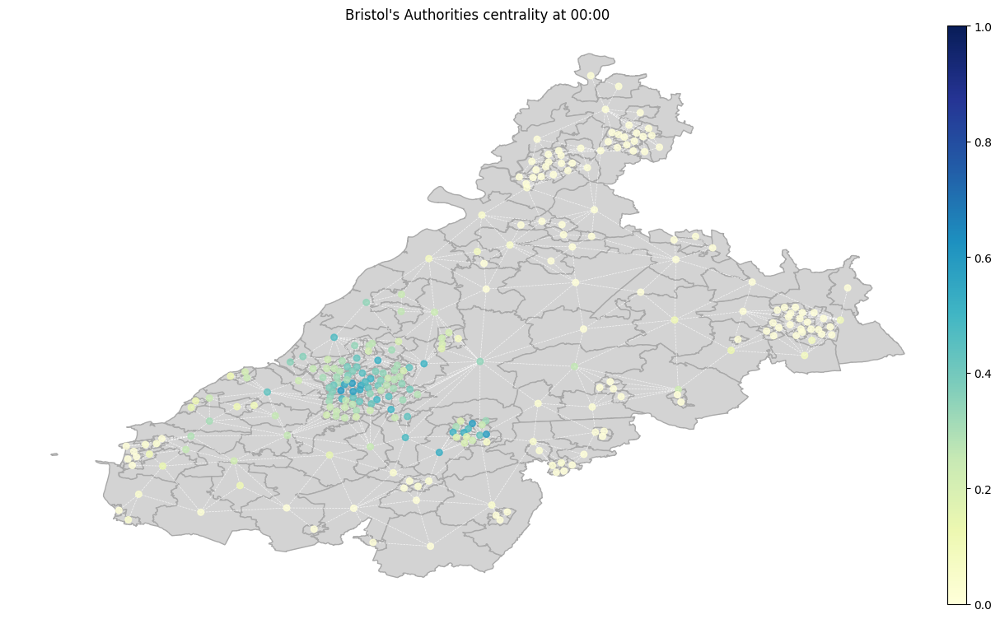

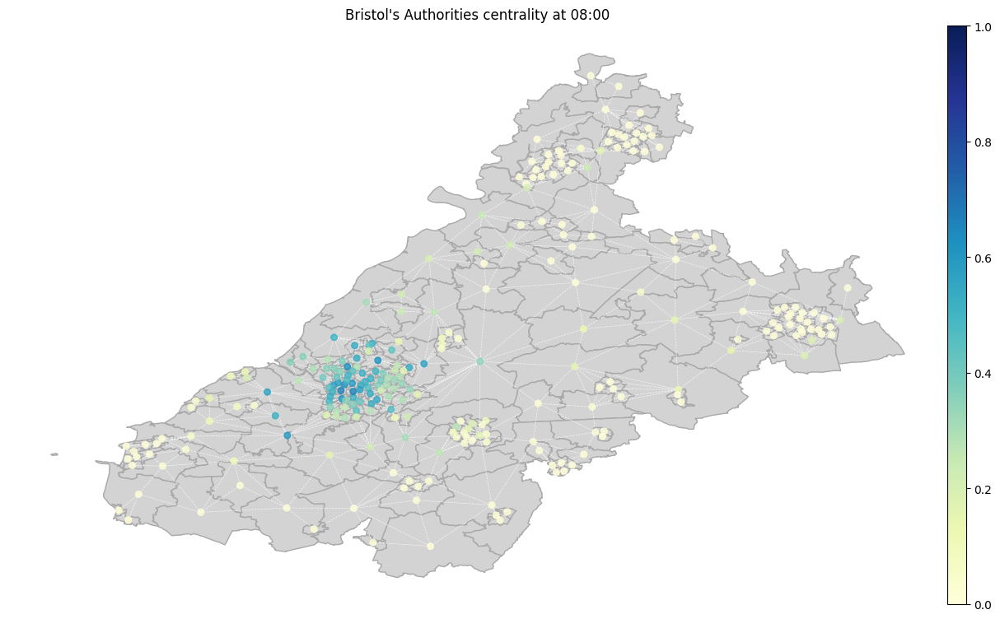

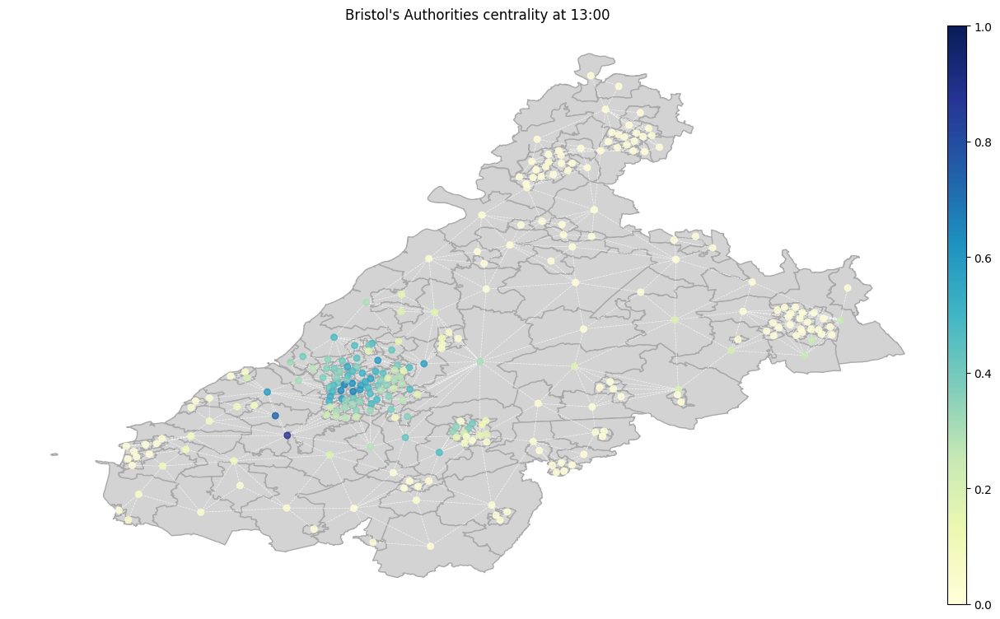

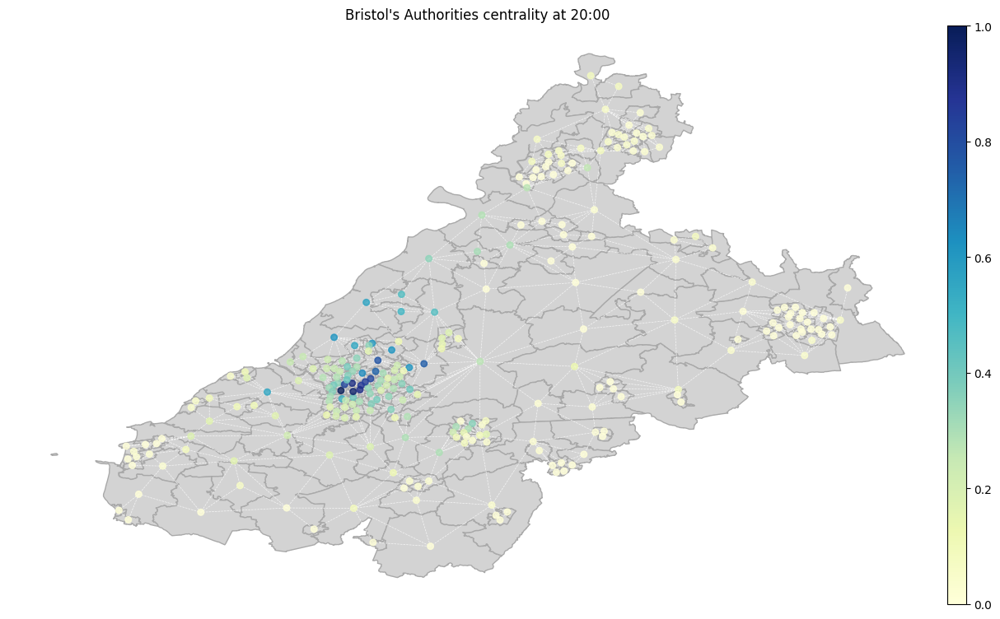

In [44]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_authorities, CITY_NAME, 'Authorities')

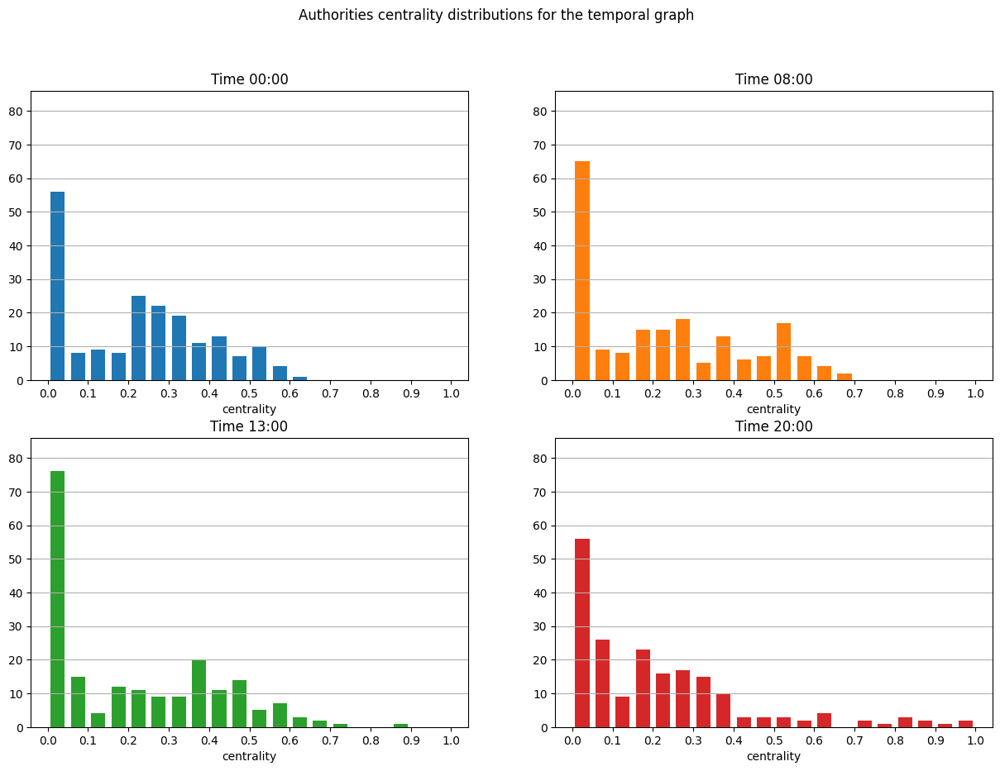

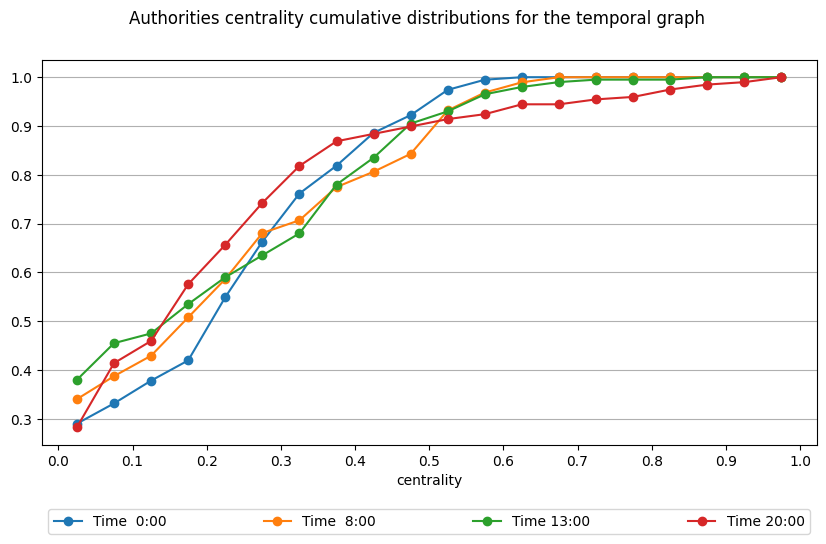

In [45]:
plot_temporal_network_centrality_distribution(temporal_networks_authorities, 'authorities centrality')

In [46]:
from utils.metrics import get_nodes_centrality

spatial_network_hits = get_nodes_centrality(spatial_network, 'hits', weight='weight', normalize=False)

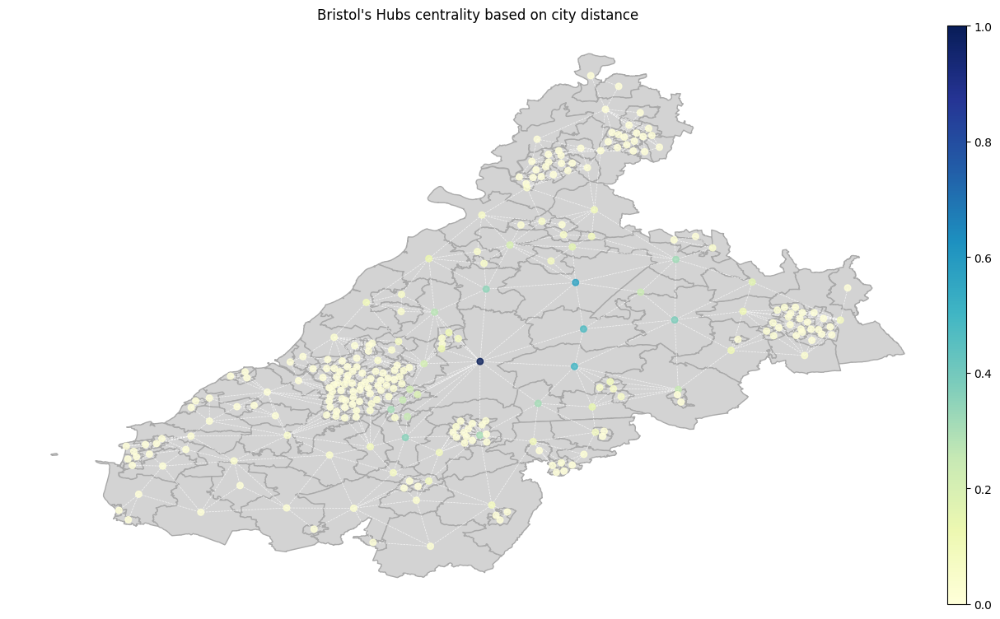

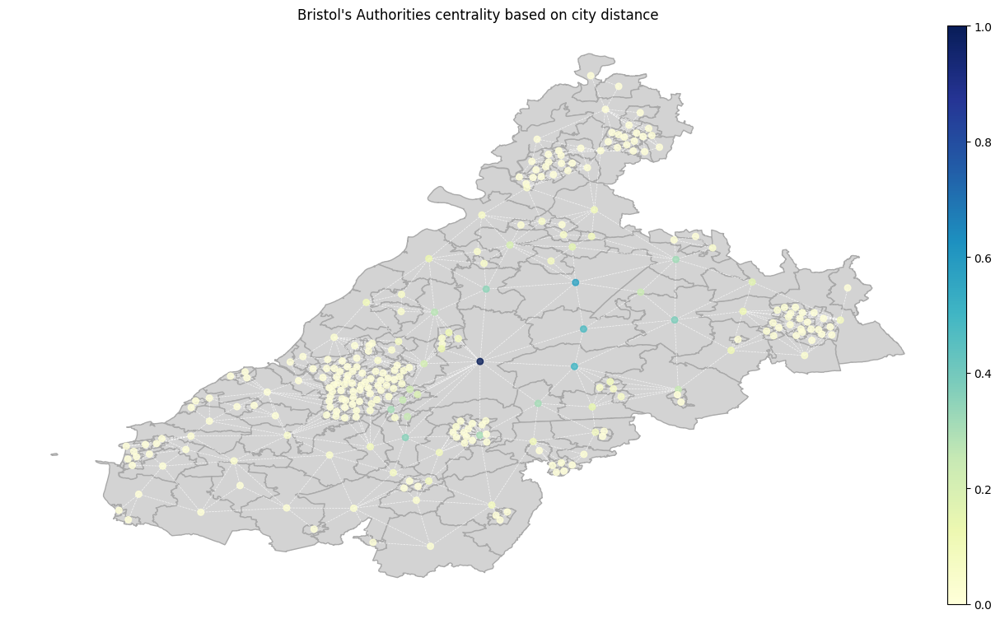

In [47]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_hits[0], 
                title = f"{CITY_NAME}'s Hubs centrality based on city distance")

plot_centrality(gdf, spatial_network, spatial_network_hits[1], 
                title = f"{CITY_NAME}'s Authorities centrality based on city distance")


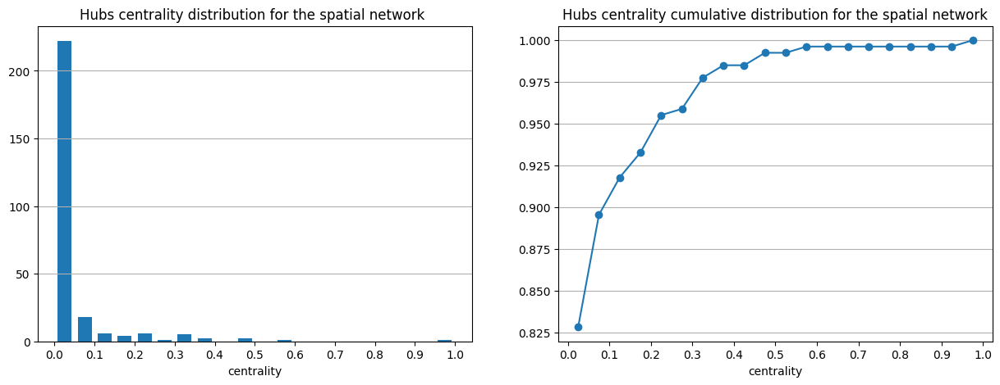

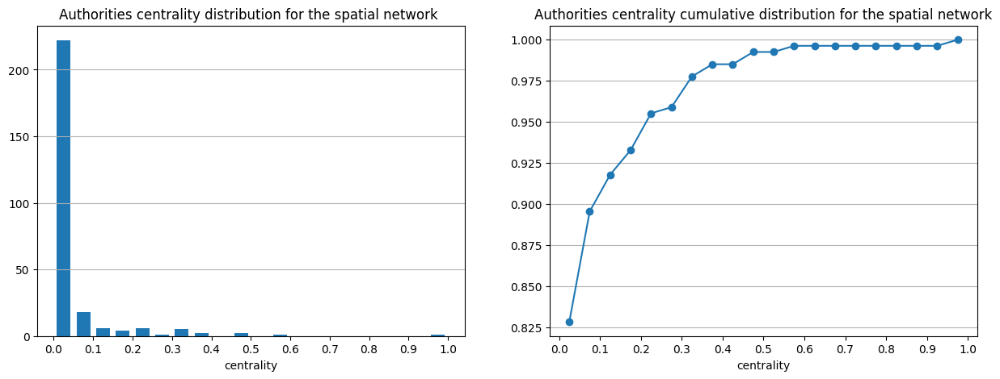

In [48]:
plot_spatial_network_centrality_distribution(spatial_network_hits[0], 'hubs centrality')
plot_spatial_network_centrality_distribution(spatial_network_hits[1], 'authorities centrality')

## Community detector

In [49]:
RESULTS_DIR = 'results'

os.makedirs(RESULTS_DIR, exist_ok=True)

In [50]:
from random import sample
from tqdm import tqdm

undirected_temporal_networks_dict = {k: v.to_undirected() for k, v in temporal_networks_dict.items()}

### Girvan-Newmann

In [51]:
from utils.metrics import get_girvan_newman_communities
from time import time

temporal_networks_girvan_newman_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_girvan_newman_communities[k] = get_girvan_newman_communities(v, weight='mean_travel_time', k=4, seed=42)
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')


Time for computing the temporal network communities at time 00:00: 127.40 s
Time for computing the temporal network communities at time 08:00: 154.05 s
Time for computing the temporal network communities at time 13:00: 42.43 s
Time for computing the temporal network communities at time 20:00: 413.35 s

Total for computing the temporal network communities at time 20:00: 737.23 s


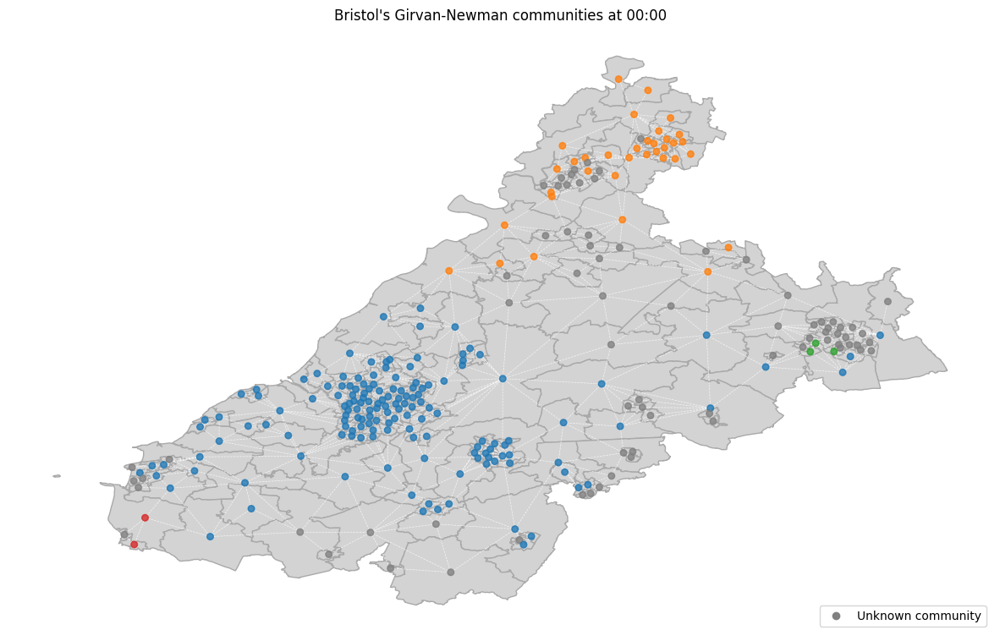

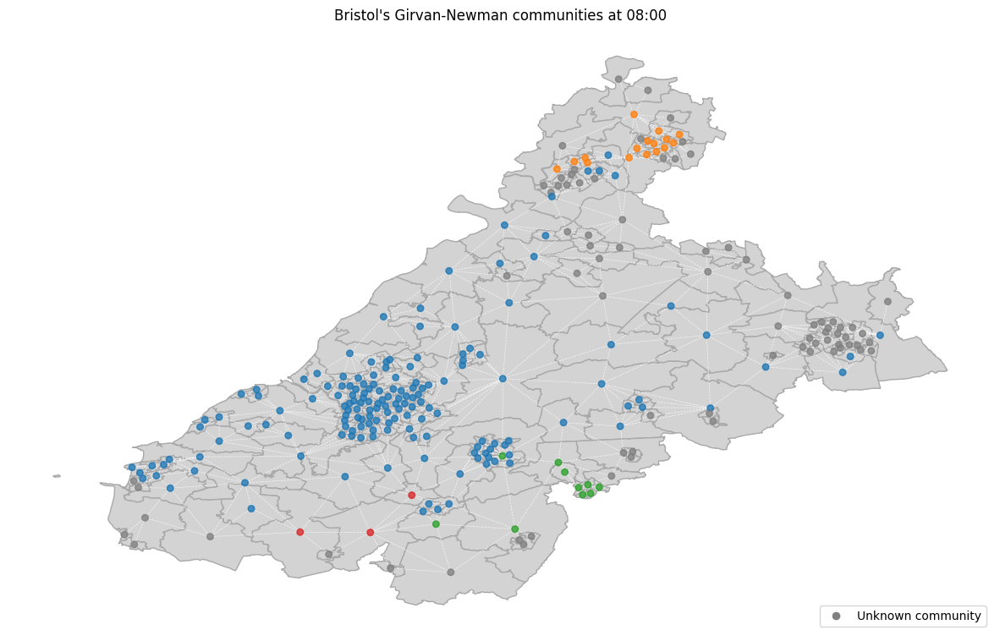

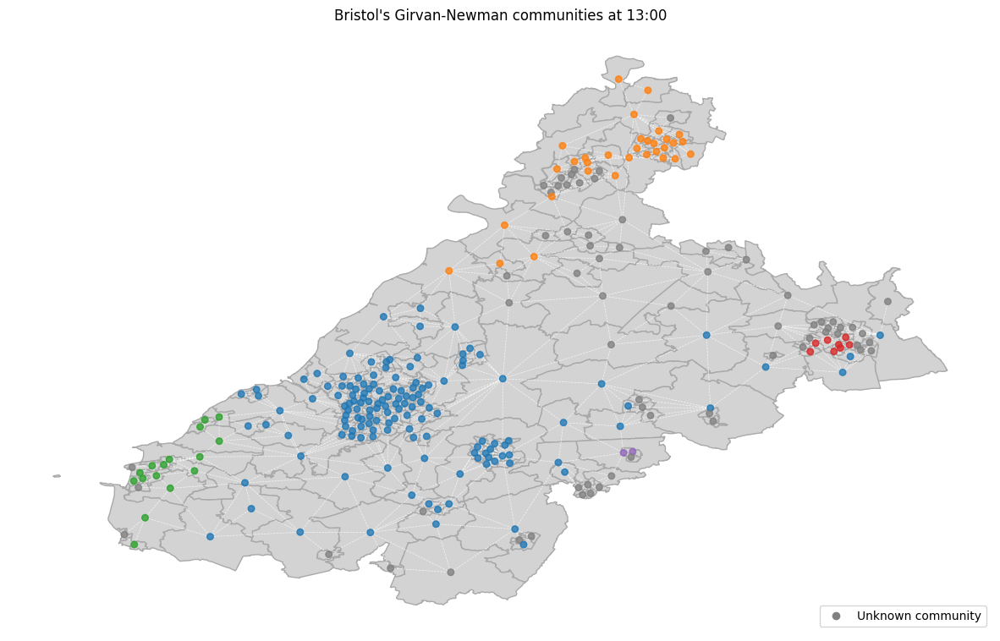

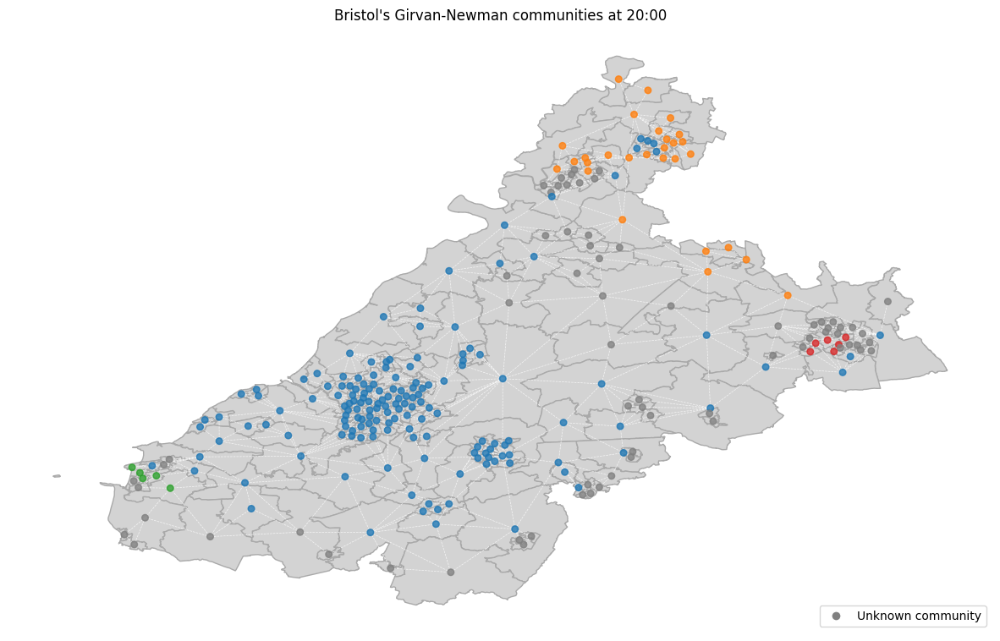

In [52]:
from utils.graphics import plot_communities

for k, v in temporal_networks_girvan_newman_communities.items():
    plot_communities(gdf, spatial_network, v, title = f"{CITY_NAME}'s Girvan-Newman communities at {k:02d}:00")

In [53]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-girvan-newman-temporal.pickle'), 'wb') as f:
    pickle.dump(temporal_networks_girvan_newman_communities, f)

In [54]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-girvan-newman-temporal.pickle'), 'rb') as f:
    temporal_networks_girvan_newman_communities = pickle.load(f)

In [55]:
from utils.metrics import get_girvan_newman_communities

start_time = time()
spatial_network_girvan_newman_communities = get_girvan_newman_communities(spatial_network, weight='weight', k=4, seed=42)
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 12.39 s


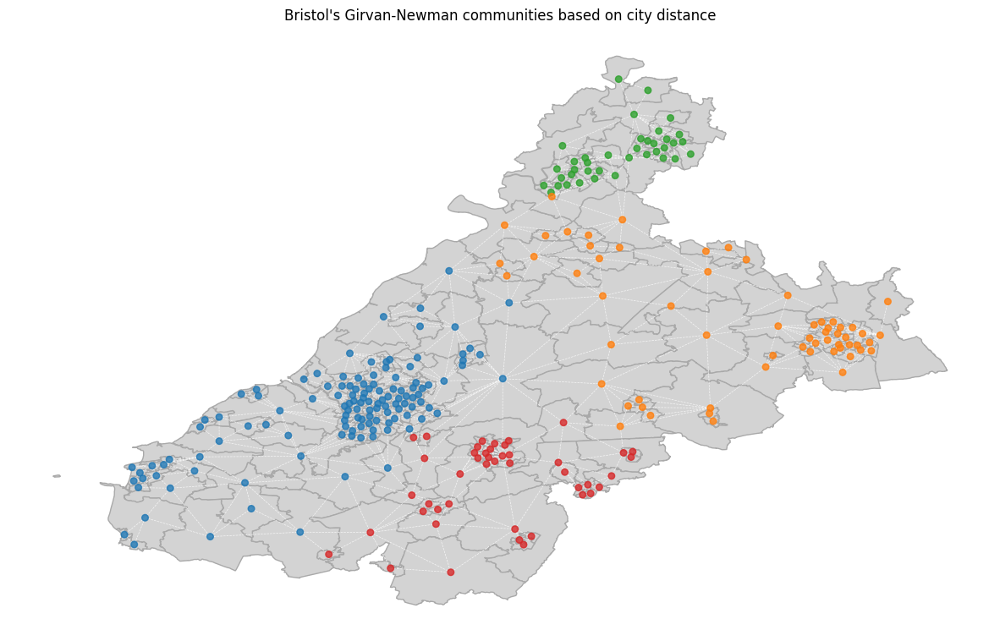

In [56]:
from utils.graphics import plot_communities
plot_communities(gdf, spatial_network, spatial_network_girvan_newman_communities, 
                 title = f"{CITY_NAME}'s Girvan-Newman communities based on city distance")

In [57]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-girvan-newman-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_girvan_newman_communities, f)

In [58]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-girvan-newman-spatial.pickle'), 'rb') as f:
    spatial_network_girvan_newman_communities = pickle.load(f)

## K-Cores

In [59]:
from utils.metrics import get_k_cores_communities
from time import time

temporal_networks_k_core_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_k_core_communities[k] = get_k_cores_communities(v, weight='mean_travel_time')
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')

Time for computing the temporal network communities at time 00:00: 0.09 s
Time for computing the temporal network communities at time 08:00: 0.09 s
Time for computing the temporal network communities at time 13:00: 0.07 s
Time for computing the temporal network communities at time 20:00: 0.10 s

Total for computing the temporal network communities at time 20:00: 0.35 s


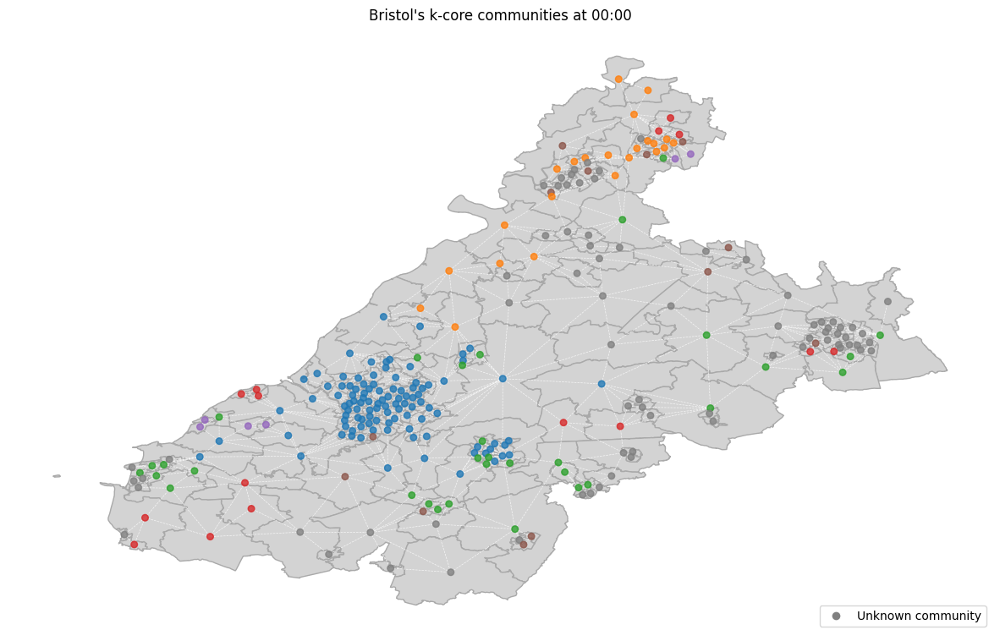

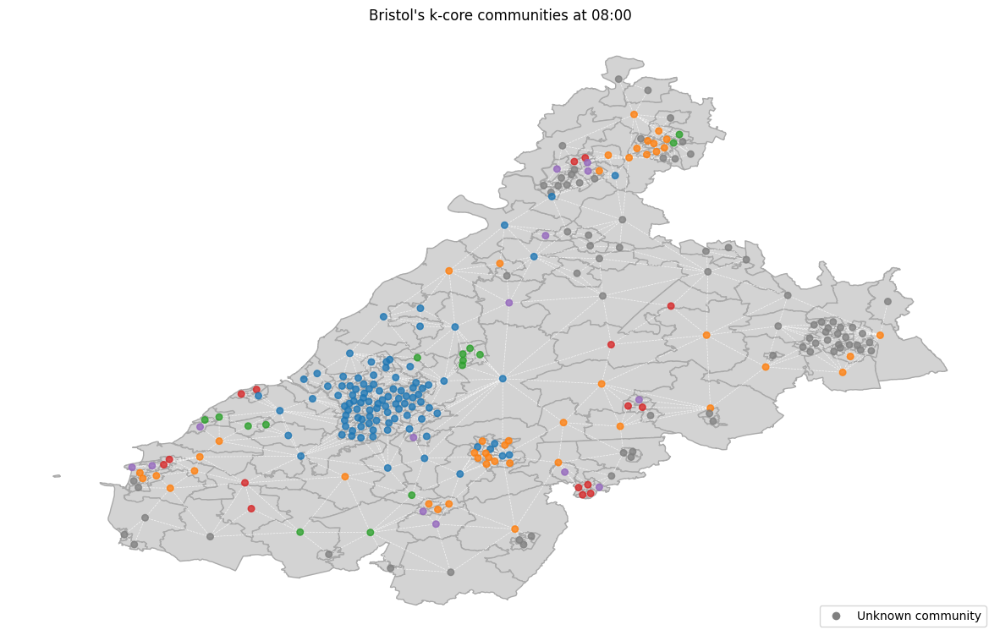

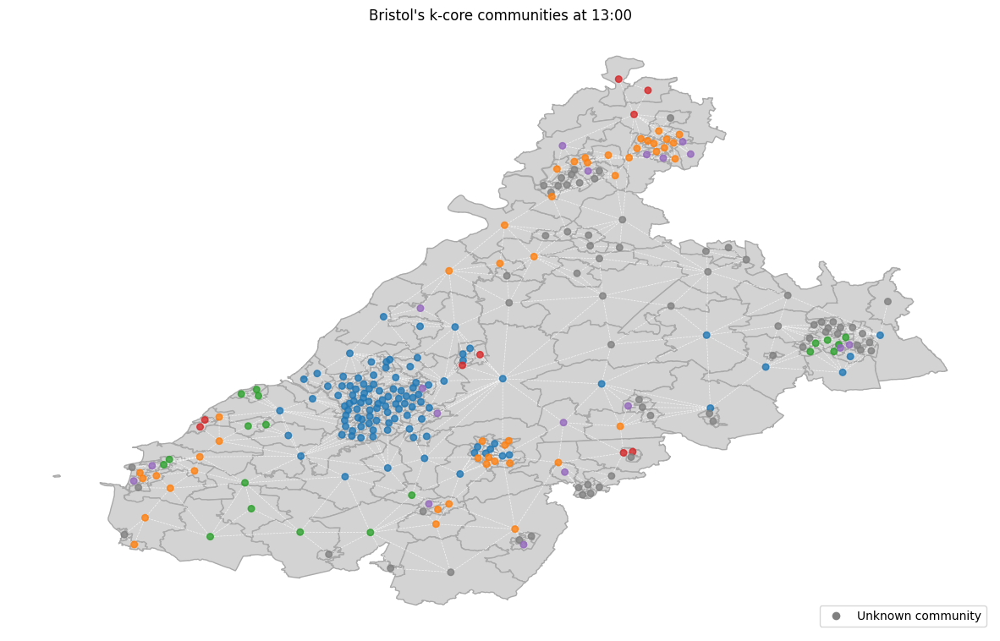

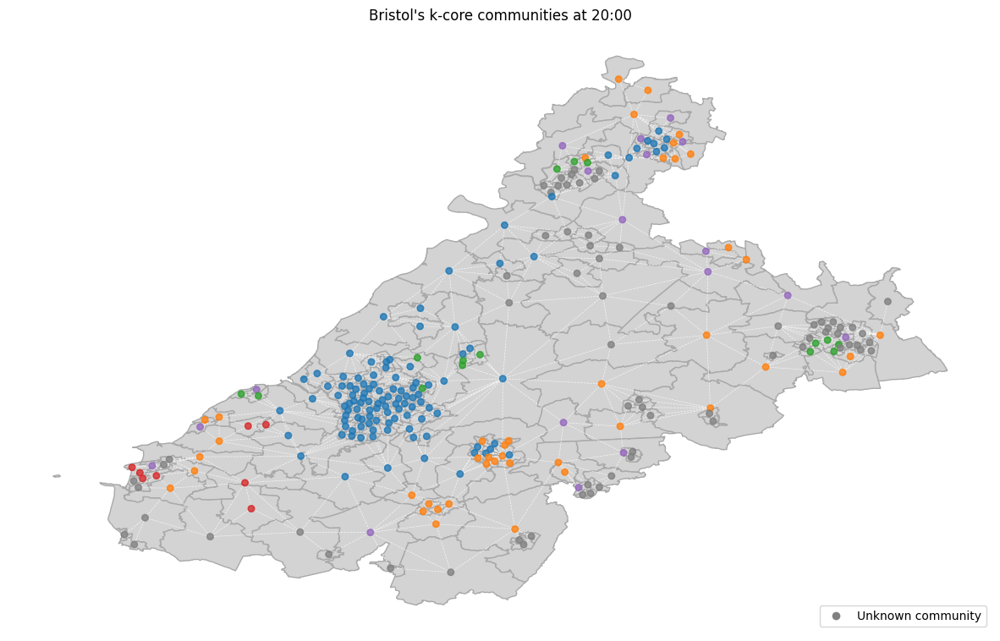

In [60]:
from utils.graphics import plot_communities

for k, v in temporal_networks_k_core_communities.items():
    plot_communities(gdf, spatial_network, v, title = f"{CITY_NAME}'s k-core communities at {k:02d}:00")

In [61]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-temporal.pickle'), 'wb') as f:
    pickle.dump(temporal_networks_k_core_communities, f)

In [62]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-temporal.pickle'), 'rb') as f:
    temporal_networks_k_core_communities = pickle.load(f)

In [63]:
from utils.metrics import get_k_cores_communities

start_time = time()
spatial_network_k_core_communities = get_k_cores_communities(spatial_network, weight='weight')
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 0.19 s


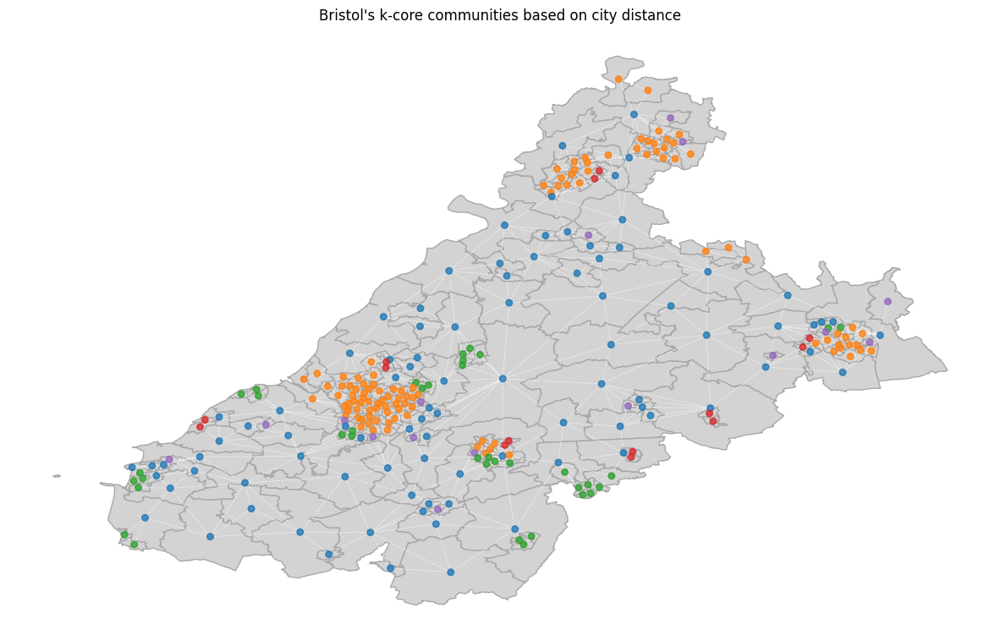

In [64]:
from utils.graphics import plot_communities
plot_communities(gdf, spatial_network, spatial_network_k_core_communities, 
                 title = f"{CITY_NAME}'s k-core communities based on city distance")

In [65]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_k_core_communities, f)

In [66]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-spatial.pickle'), 'rb') as f:
    spatial_network_k_core_communities = pickle.load(f)

## K-clique

In [67]:
from utils.metrics import get_k_clique_communities
from time import time

temporal_networks_k_clique_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_k_clique_communities[k] = get_k_clique_communities(v, weight='mean_travel_time', k=4)
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')

Time for computing the temporal network communities at time 00:00: 1.16 s
Time for computing the temporal network communities at time 08:00: 3.78 s
Time for computing the temporal network communities at time 13:00: 1.24 s
Time for computing the temporal network communities at time 20:00: 1.96 s

Total for computing the temporal network communities at time 20:00: 8.13 s


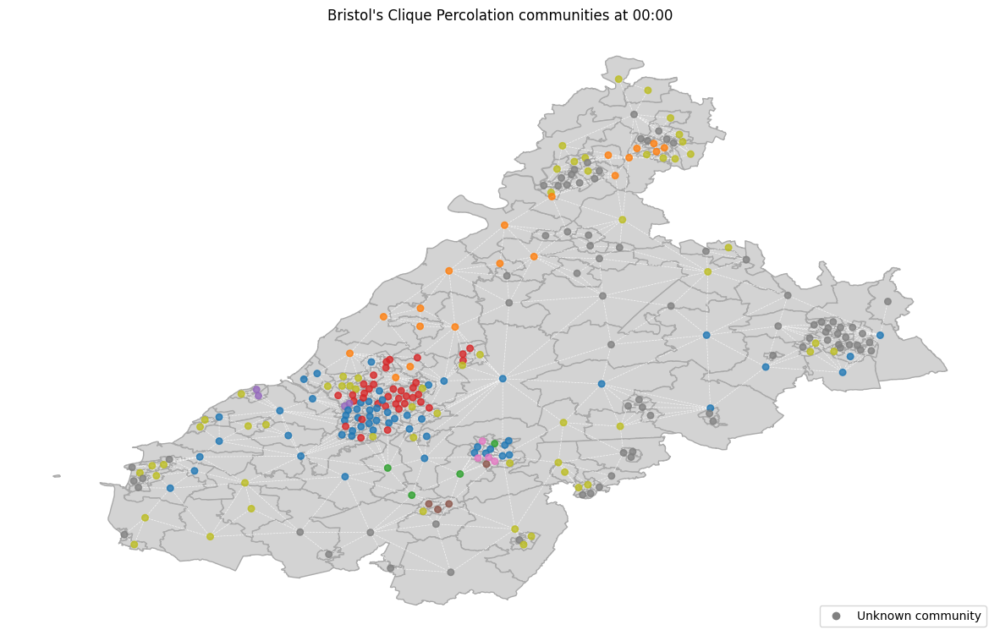

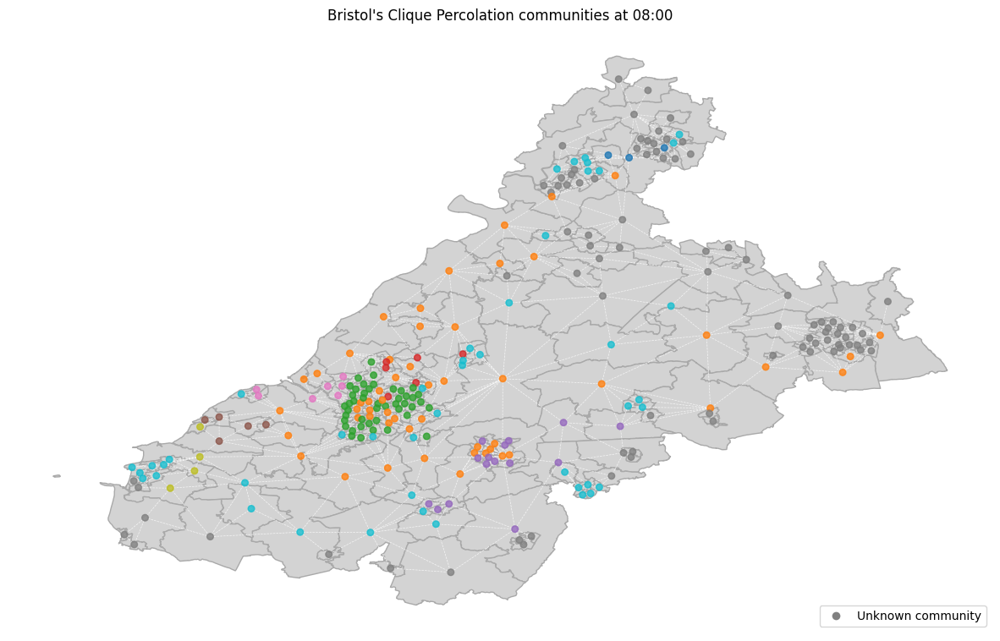

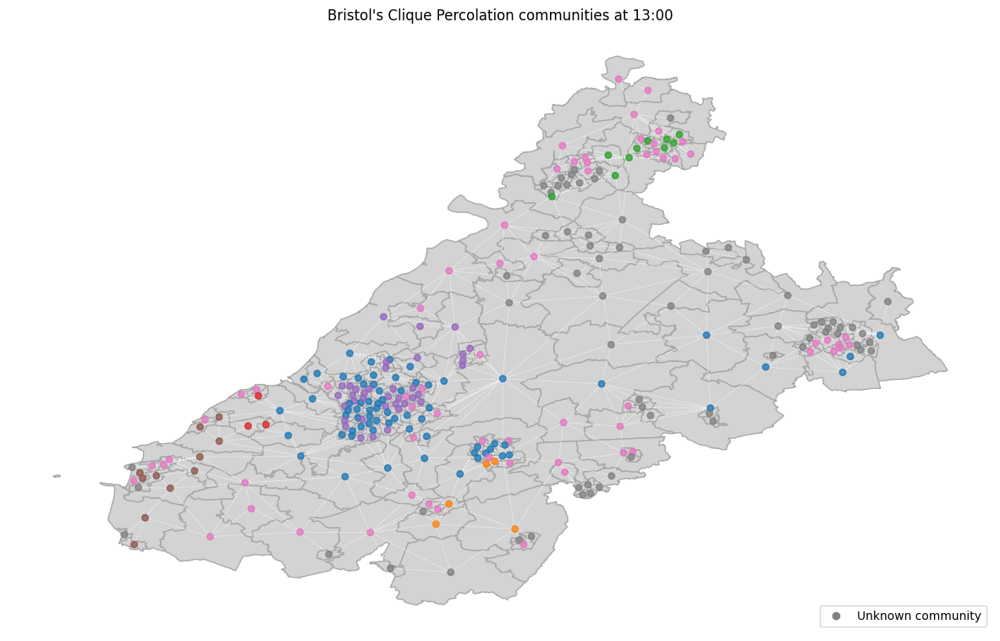

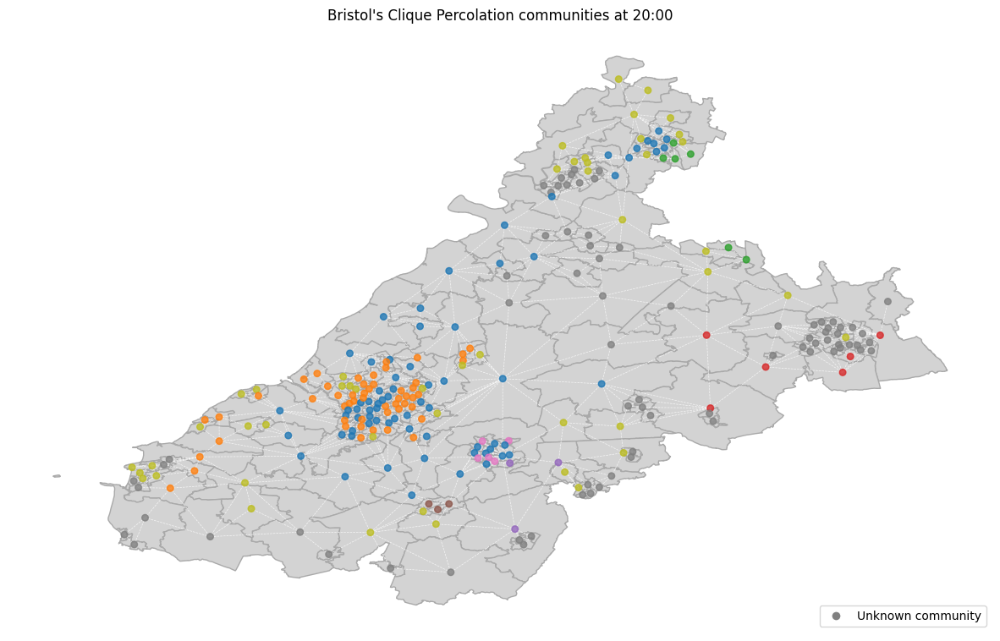

In [68]:
from utils.graphics import plot_communities

for k, v in temporal_networks_k_clique_communities.items():
    plot_communities(gdf, spatial_network, v,
                     title=f"{CITY_NAME}'s Clique Percolation communities at {k:02d}:00")

In [69]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-cliques-percolation-temporal.pickle'), 'wb') as f:
    pickle.dump(temporal_networks_k_clique_communities, f)

In [70]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-cliques-percolation-temporal.pickle'), 'rb') as f:
    temporal_networks_k_clique_communities = pickle.load(f)

In [71]:
from utils.metrics import get_k_clique_communities

start_time = time()
spatial_network_clique_percolation_communities = get_k_clique_communities(spatial_network, weight='weight', k=2)
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 0.03 s


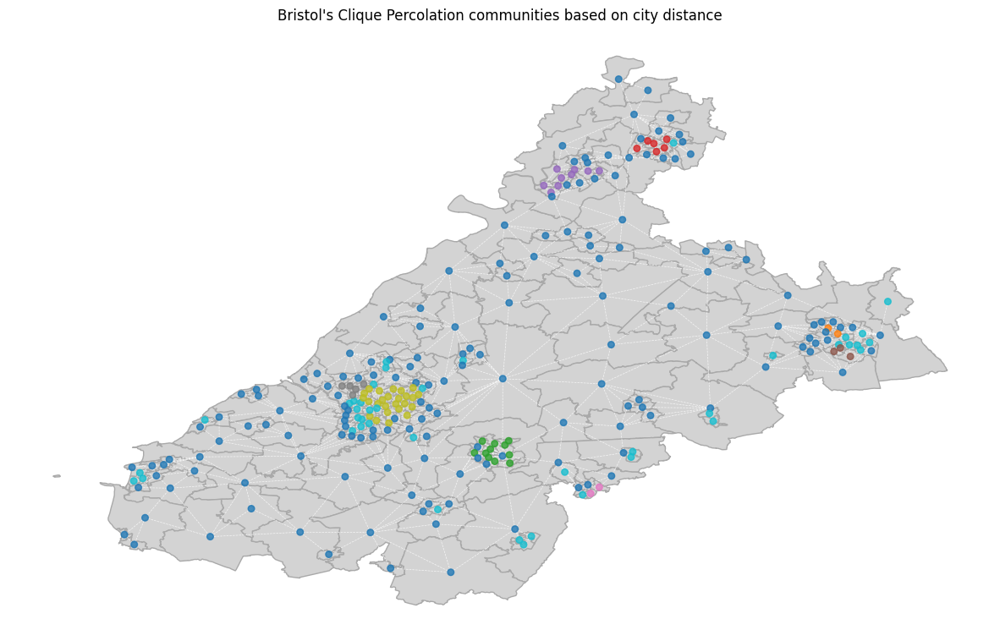

In [72]:
from utils.graphics import plot_communities
plot_communities(gdf, spatial_network, spatial_network_clique_percolation_communities, 
                 title = f"{CITY_NAME}'s Clique Percolation communities based on city distance")

In [73]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-cliques-percolation-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_clique_percolation_communities, f)

In [74]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-cliques-percolation-spatial.pickle'), 'rb') as f:
    spatial_network_clique_percolation_communities = pickle.load(f)

## Louvain

In [75]:
from utils.metrics import get_louvain_communities
from time import time

temporal_networks_louvain_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_louvain_communities[k] = get_louvain_communities(v, weight='mean_travel_time')
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')

Time for computing the temporal network communities at time 00:00: 0.03 s
Time for computing the temporal network communities at time 08:00: 0.13 s
Time for computing the temporal network communities at time 13:00: 0.03 s
Time for computing the temporal network communities at time 20:00: 0.04 s

Total for computing the temporal network communities at time 20:00: 0.22 s


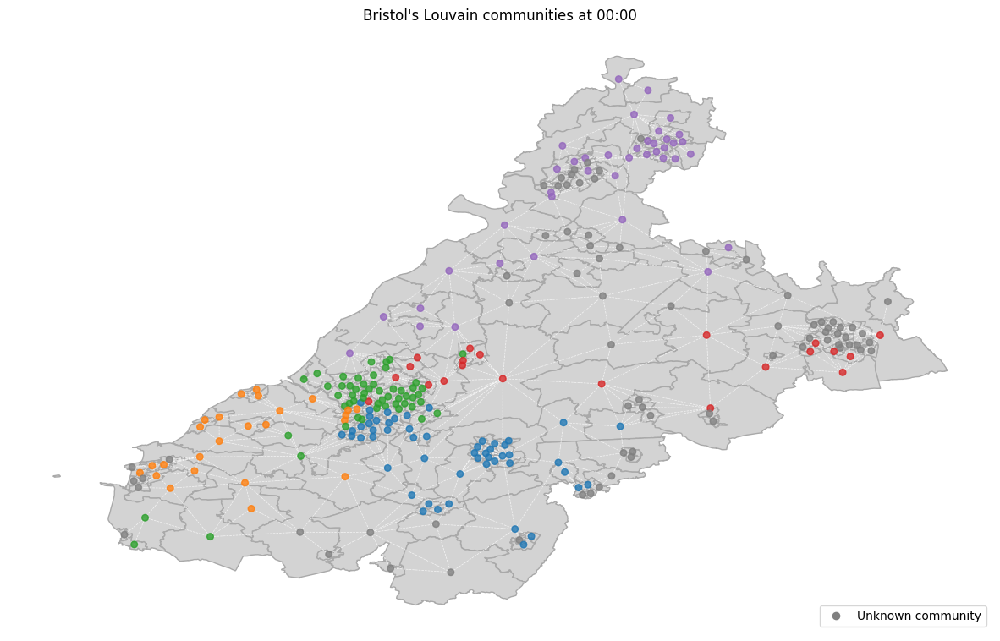

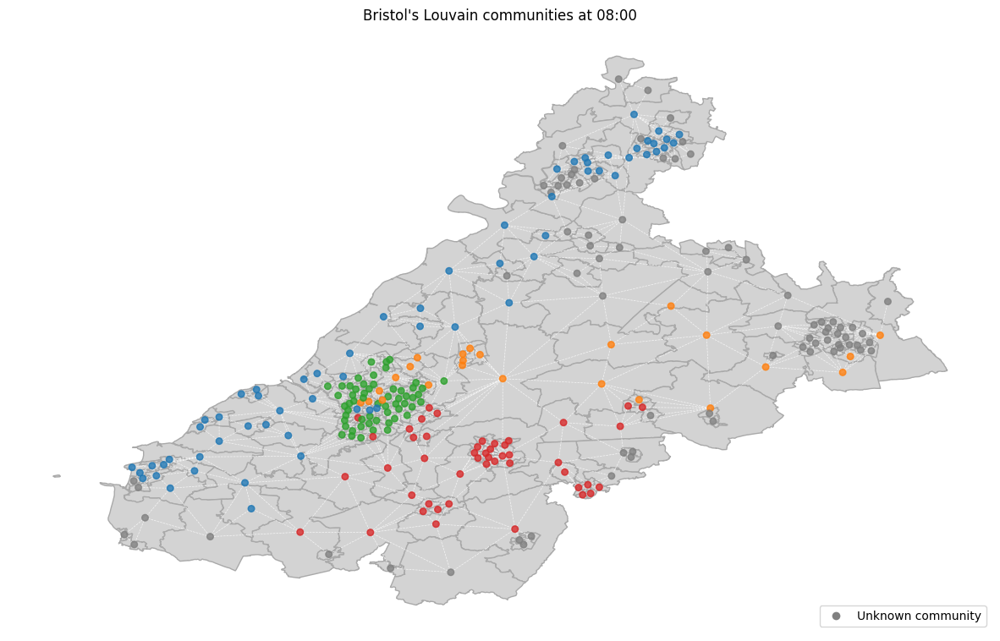

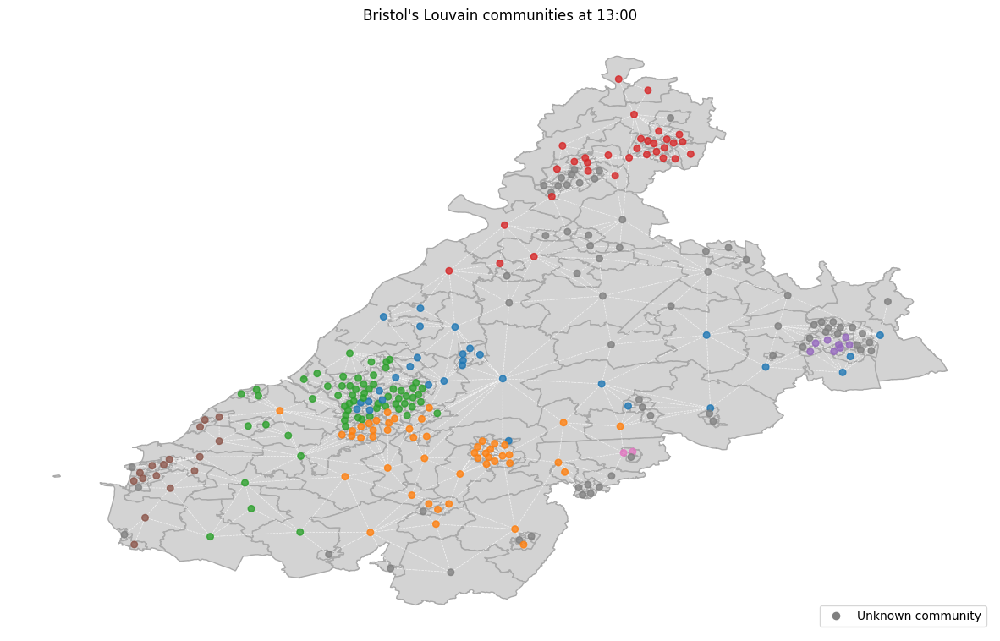

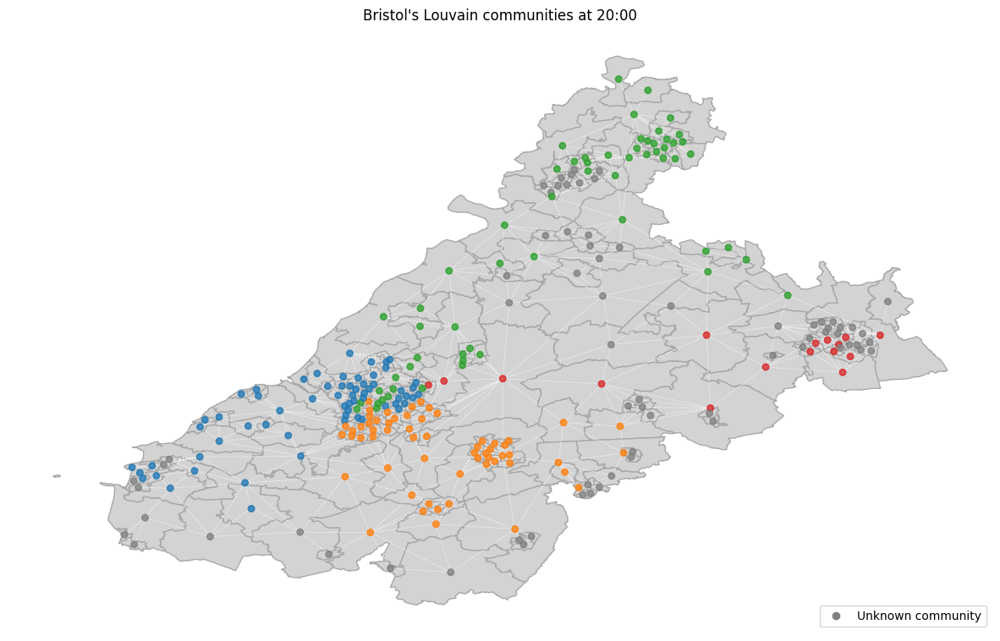

In [76]:
from utils.graphics import plot_communities

for k, v in temporal_networks_louvain_communities.items():
    plot_communities(gdf, spatial_network, v,
                     title=f"{CITY_NAME}'s Louvain communities at {k:02d}:00")

In [77]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-temporal.pickle'), 'wb') as f:
    pickle.dump(temporal_networks_louvain_communities, f)

In [78]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-temporal.pickle'), 'rb') as f:
    temporal_networks_louvain_communities = pickle.load(f)

In [79]:
from utils.metrics import get_louvain_communities

start_time = time()
spatial_network_louvain_communities = get_louvain_communities(spatial_network, weight='weight')
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 0.02 s


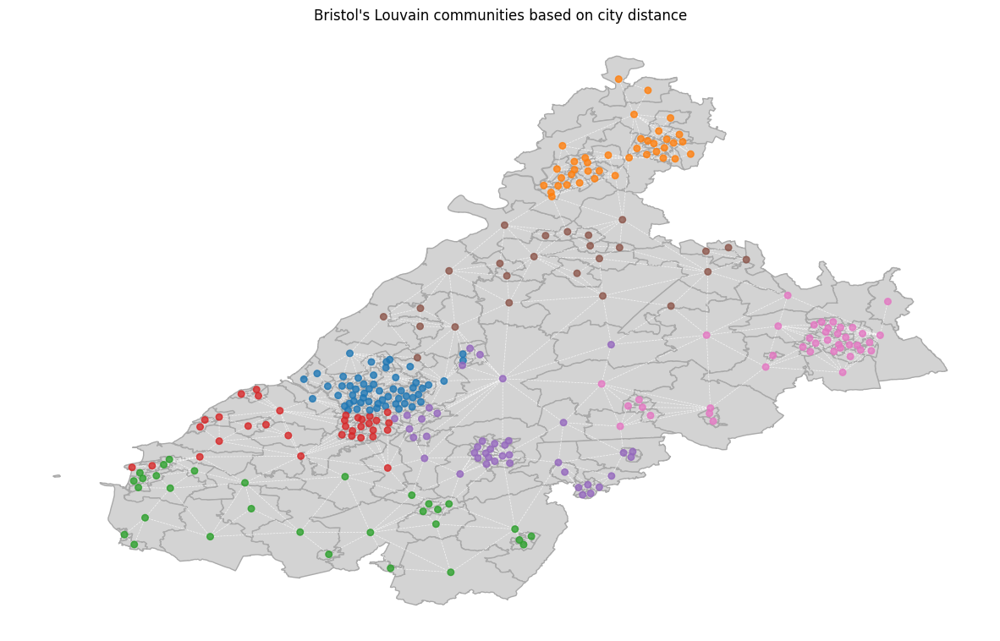

In [80]:
from utils.graphics import plot_communities
plot_communities(gdf, spatial_network, spatial_network_louvain_communities, 
                 title = f"{CITY_NAME}'s Louvain communities based on city distance")

In [81]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_louvain_communities, f)

In [82]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-spatial.pickle'), 'rb') as f:
    spatial_network_louvain_communities = pickle.load(f)

## Metrics

In [83]:
from typing import Dict

def get_modularity_score(network: nx.Graph, node_community_dict: Dict[str, int], weight: str):
    communities_labels = set(node_community_dict.values())
    communities = {l: [] for l in communities_labels}
    for k, v in node_community_dict.items():
        communities[v].append(k)
    return nx.community.modularity(network, communities.values(), weight=weight)

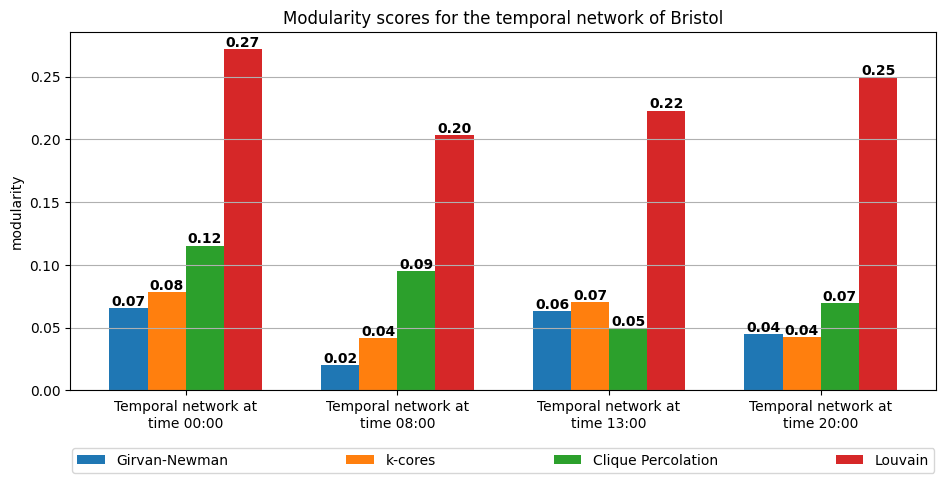

In [84]:
import matplotlib.pyplot as plt
import numpy as np

community_algorithms = ['Girvan-Newman', 'k-cores', 'Clique Percolation', 'Louvain']

modularity_scores_temporal = { n: [] for n in community_algorithms }

for k, v in  undirected_temporal_networks_dict.items():
    modularity_scores_temporal['Girvan-Newman'].append(
          get_modularity_score(v,temporal_networks_girvan_newman_communities[k], weight='mean_travel_time'))
    modularity_scores_temporal['k-cores'].append(
          get_modularity_score(v, temporal_networks_k_core_communities[k], weight='mean_travel_time'))
    modularity_scores_temporal['Clique Percolation'].append(
          get_modularity_score(v, temporal_networks_k_clique_communities[k], weight='mean_travel_time'))
    modularity_scores_temporal['Louvain'].append(
          get_modularity_score(v, temporal_networks_louvain_communities[k], weight='mean_travel_time'))

labels = [f'Temporal network at\ntime {k:02d}:00' for k in undirected_temporal_networks_dict.keys()]

cmap = plt.get_cmap('tab10')

x = np.arange(len(labels))  # the label locations
width = 0.18  # the width of the bars
padding = 0.3
fig, ax = plt.subplots(figsize=(10,5))

for i, (k, v) in enumerate(modularity_scores_temporal.items()):
      if i == 0:
            ax.bar(x - width * 1.5, v, width, label=k, color=cmap.colors[0])
            for x_, v_ in zip(x, v):
                  ax.text(x_ - .08 - width * 1.5, v_ + .002, f'{v_:.2f}', color='black', fontweight='bold')
      elif i == 1:
            ax.bar(x - width / 2, v, width, label=k, color=cmap.colors[1])
            for x_, v_ in zip(x, v):
                  ax.text(x_ - .08 - width / 2, v_ + .002, f'{v_:.2f}', color='black', fontweight='bold')
      elif i == 2:
            ax.bar(x + width / 2, v, width, label=k, color=cmap.colors[2])
            for x_, v_ in zip(x, v):
                  ax.text(x_ - .08 + width / 2, v_ + .002, f'{v_:.2f}', color='black', fontweight='bold')
      else:
            ax.bar(x + width * 1.5, v, width, label=k, color=cmap.colors[3])
            for x_, v_ in zip(x, v):
                  ax.text(x_ - .08 + width * 1.5, v_ + .002, f'{v_:.2f}', color='black', fontweight='bold')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('modularity')
ax.set_title(f'Modularity scores for the temporal network of {CITY_NAME}')
ax.set_xticks(x, labels)
ax.legend(loc='lower center', ncol=len(modularity_scores_temporal), bbox_to_anchor=(.5, -.25),
          columnspacing=8.5)

#plt.legend(loc="lower left", ncol = len(ax.lines) )


#ax.bar_label(rects1, padding=3)
#ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.grid(axis='y')

plt.show()


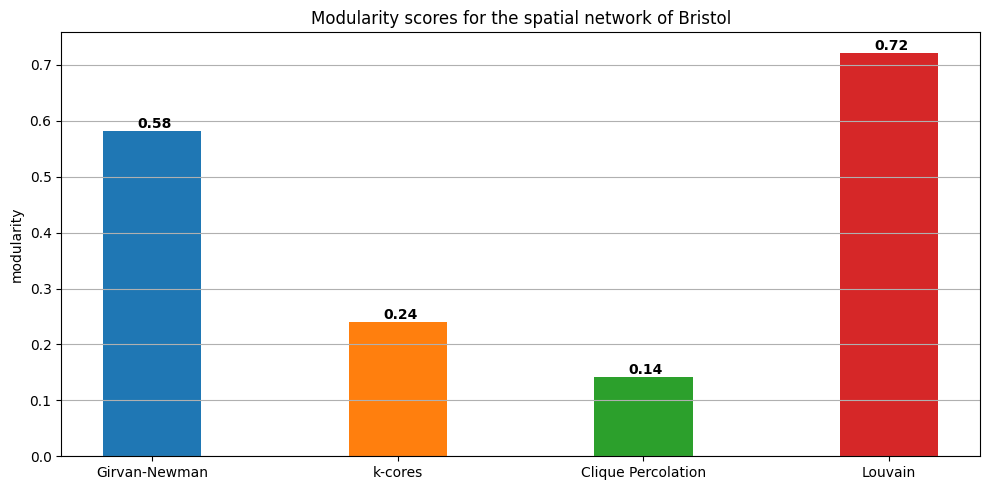

In [85]:
import matplotlib.pyplot as plt
import numpy as np

community_algorithms = ['Girvan-Newman', 'k-cores', 'Clique Percolation', 'Louvain']
modularities = [
      get_modularity_score(spatial_network, spatial_network_girvan_newman_communities, weight='weight'),
      get_modularity_score(spatial_network, spatial_network_k_core_communities, weight='weight'),
      get_modularity_score(spatial_network, spatial_network_clique_percolation_communities, weight='weight'),
      get_modularity_score(spatial_network, spatial_network_louvain_communities, weight='weight')
      ]

# labels = [f'Temporal network at\ntime {k:02d}:00' for k in undirected_temporal_networks_dict.keys()]

x = np.arange(len(community_algorithms))  # the label locations
width = 0.4
fig, ax = plt.subplots(figsize=(10, 5))

cmap = plt.get_cmap('tab10')
#for alg, mod in modularities:
ax.bar(x, modularities, width, color=cmap.colors[:len(x)])

for position, score in zip(x, modularities):
      ax.text(position - .06, score + .005, f'{score:.2f}', color='black', fontweight='bold')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('modularity')
ax.set_title(f'Modularity scores for the spatial network of {CITY_NAME}')
ax.set_xticks(x, community_algorithms)

#ax.bar_label(rects1, padding=3)
#ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.grid(axis='y')

plt.show()
